## <span style="color:blue">  Python exercises 11</span>

### Exercise 11.1

In order to make practice with NN, explore how does the previous linear regression depend on the number of epochs, $N_{\mathrm{epochs}}$, the number of data points $N_{\mathrm{train}}$ and on the noise $\sigma$. Try to improve the previous result operating on these parameters.

In [220]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Activation
from tensorflow.keras import backend as K
from tensorflow.keras.utils import get_custom_objects
from keras.optimizers import SGD, Adam, RMSprop, Adagrad, Adadelta, Adam, Adamax, Nadam
plt.rcParams.update({'font.size': 15})

In [28]:
def NN_model(n_epoche,n_train,sigma):   
    
    # target parameters of f(x) = m*x + b
    m = 2 # slope
    b = 1 # intersect
    # generate training inputs
    np.random.seed(0)
    x_train = np.random.uniform(-1, 1, n_train)
    x_valid = np.random.uniform(-1, 1, 50)
    x_valid.sort()
    y_target = m * x_valid + b # ideal (target) linear function

    # sigma is the noise standard deviation, for the moment it is absent
    y_train = np.random.normal(m * x_train + b, sigma) # actual measures from which we want to guess regression parameters
    y_valid = np.random.normal(m * x_valid + b, sigma)
    
    
    model = tf.keras.Sequential()
    model.add(Dense(1, input_shape=(1,)))

    # compile the model choosing optimizer, loss and metrics objects
    model.compile(optimizer='sgd', loss='mse', metrics=['mse'])
    #callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=3)
    history = model.fit(x=x_train, y=y_train, epochs=n_epoche, shuffle=True, batch_size=32,
                            validation_data=(x_valid, y_valid),verbose=False)

    score = model.evaluate(x_valid, y_target, batch_size=32, verbose=1)

    # print performance
    print("target")
    print('Test loss:', score[0])
    print('Test accuracy:', score[1])

    # return weights and biases
    print("coefficente angolare predizione", model.get_weights()[0])
    print("termine noto predizione", model.get_weights()[1])


    # look into training history
    # Plot training & validation loss values
    plt.plot(history.history['loss'],label="loss")
    plt.plot(history.history['val_loss'],label="val_loss")
    plt.title('Model loss, epochs='+str(n_epoche)+"  N_train="+str(n_train)+"  sigma="+str(sigma))
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(loc='best')
    plt.grid()
    plt.show()

    x_predicted = np.random.uniform(-1, 1, 100)
    y_predicted = model.predict(x_predicted)
    plt.scatter(x_predicted, y_predicted,color='r',label='prediction',marker="*")
    plt.plot(x_valid, y_target, label='target',color="blue")
    plt.xlabel("x")
    plt.ylabel("y")
    plt.legend()
    plt.grid(True)
    plt.show()
    
    
    loss_epochs[f'loss_epochs_{n_epoche}'] = history.history['loss']
    loss_ntrain[f'loss_ntrain_{n_train}'] = history.history['loss']
    loss_sigma[f'loss_sigma_{sigma}'] = history.history['loss']
    
    val_loss_epochs[f'loss_epochs_{n_epoche}'] = history.history['val_loss']
    val_loss_ntrain[f'loss_ntrain_{n_train}'] = history.history['val_loss']
    val_loss_sigma[f'loss_sigma_{sigma}'] = history.history['val_loss']
    #return loss_epochs

### MODEL VARYING THE NUMBER OF EPOCHES

2/2 [==============================] - 0s 1ms/step - loss: 0.0531 - mse: 0.0531
target
Test loss: 0.05307047814130783
Test accuracy: 0.05307047814130783
coefficente angolare predizione [[1.5911942]]
termine noto predizione [0.9933493]


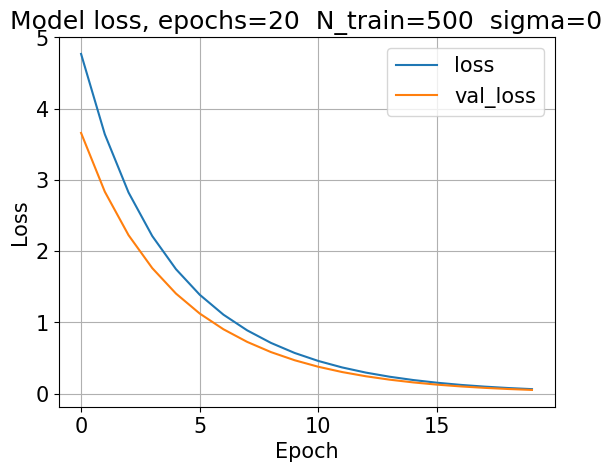

4/4 [==============================] - 0s 679us/step


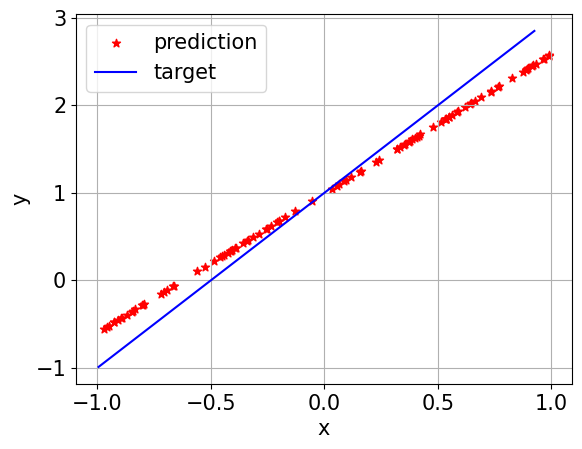

2/2 [==============================] - 0s 1ms/step - loss: 4.5890e-05 - mse: 4.5890e-05
target
Test loss: 4.588998490362428e-05
Test accuracy: 4.588998490362428e-05
coefficente angolare predizione [[1.9879868]]
termine noto predizione [0.99987036]


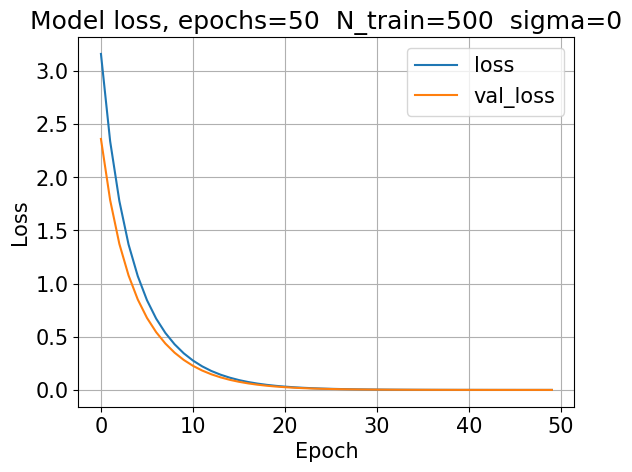

4/4 [==============================] - 0s 602us/step


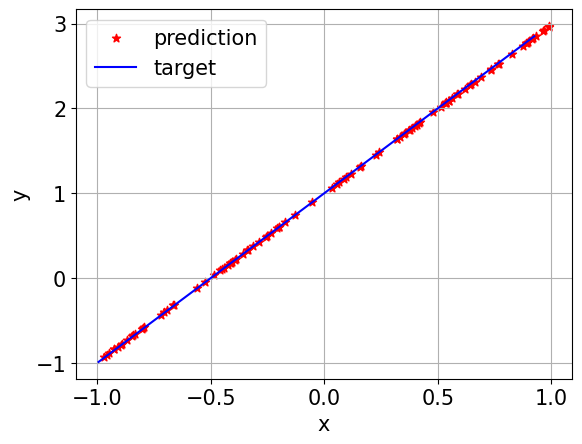

2/2 [==============================] - 0s 1ms/step - loss: 1.0581e-09 - mse: 1.0581e-09
target
Test loss: 1.0580510911850638e-09
Test accuracy: 1.0580510911850638e-09
coefficente angolare predizione [[1.9999423]]
termine noto predizione [0.99999934]


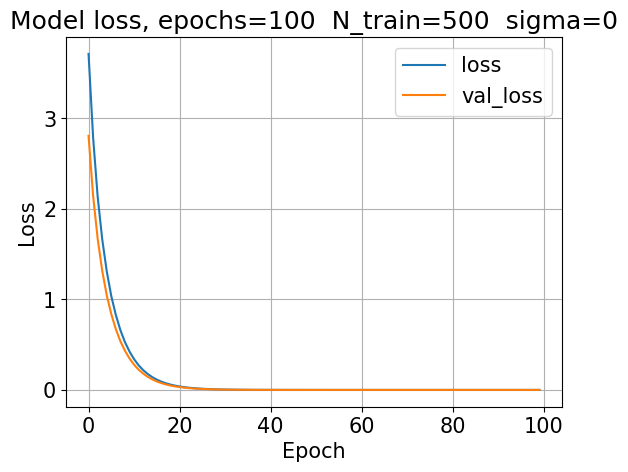

4/4 [==============================] - 0s 1ms/step


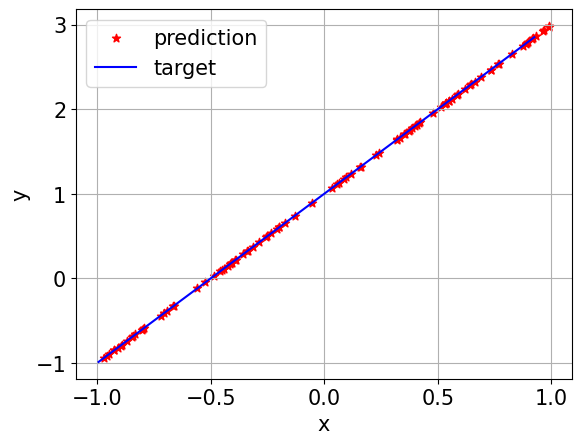

2/2 [==============================] - 0s 1ms/step - loss: 1.2210e-11 - mse: 1.2210e-11
target
Test loss: 1.2209760980042006e-11
Test accuracy: 1.2209760980042006e-11
coefficente angolare predizione [[1.9999938]]
termine noto predizione [0.99999994]


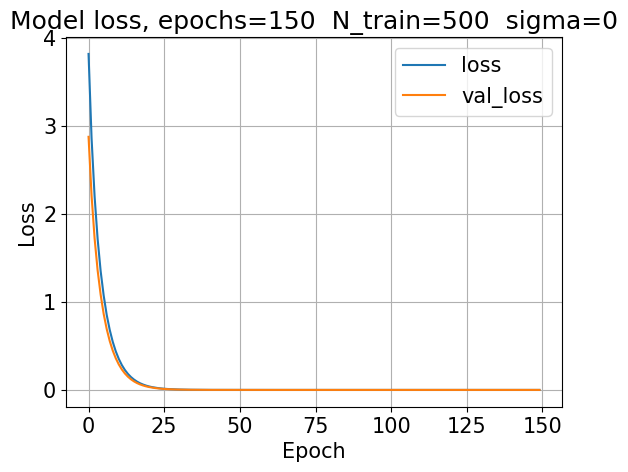

4/4 [==============================] - 0s 704us/step


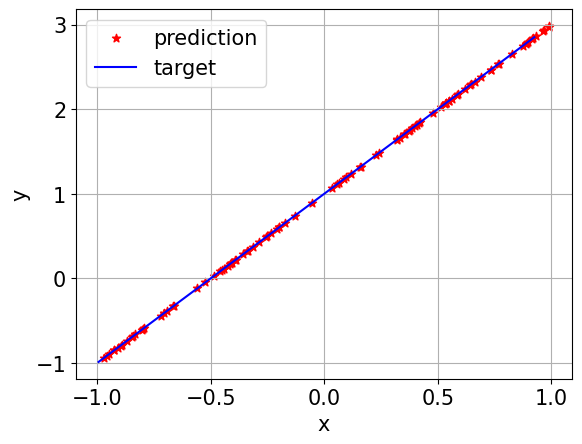

2/2 [==============================] - 0s 1ms/step - loss: 1.0877e-11 - mse: 1.0877e-11
target
Test loss: 1.0877129058561863e-11
Test accuracy: 1.0877129058561863e-11
coefficente angolare predizione [[1.9999942]]
termine noto predizione [0.9999999]


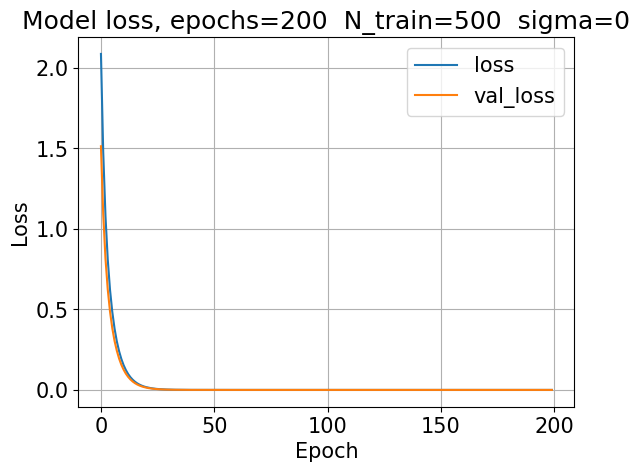

4/4 [==============================] - 0s 677us/step


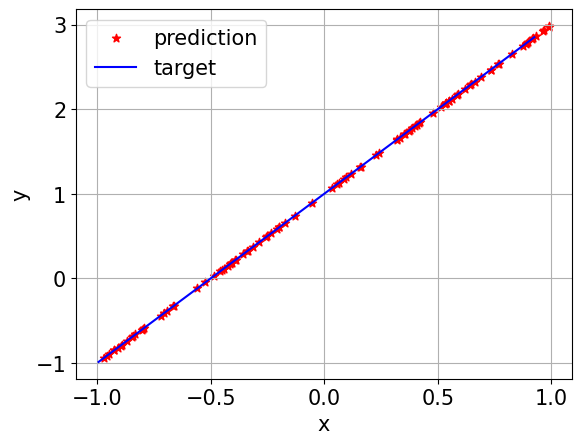

In [29]:
loss_epochs={}
loss_ntrain={}
loss_sigma={}
val_loss_epochs={}
val_loss_ntrain={}
val_loss_sigma={}
array_epochs = [20,50,100,150,200]
for epoche in array_epochs:
    NN_model(epoche,500,0)

epoche: 20   loss: 0.06408365070819855
epoche: 50   loss: 5.533411240321584e-05
epoche: 100   loss: 1.2681125038938035e-09
epoche: 150   loss: 1.3044360730463112e-11
epoche: 200   loss: 1.1498029958700862e-11


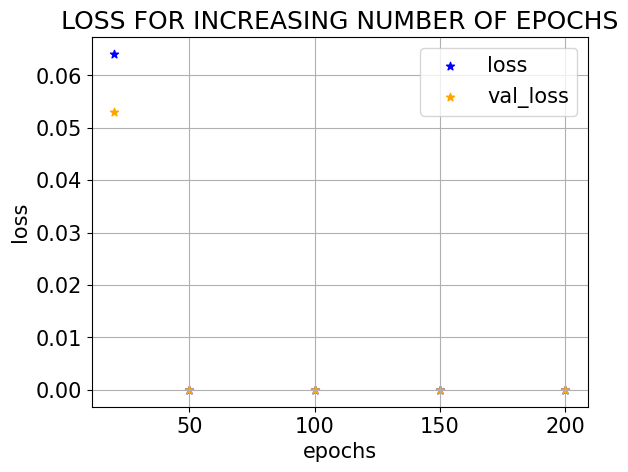

In [30]:
plt.ylabel("loss")
plt.xlabel("epochs")
plt.title("LOSS FOR INCREASING NUMBER OF EPOCHS")
plt.grid()
for epoche in array_epochs:
    plt.scatter(epoche,loss_epochs[f'loss_epochs_{epoche}'][-1],marker="*",color="blue")
    plt.scatter(epoche,val_loss_epochs[f'loss_epochs_{epoche}'][-1],marker="*",color="orange")
    print("epoche:",str(epoche),"  loss:",str(loss_epochs[f'loss_epochs_{epoche}'][-1]))
plt.legend(["loss","val_loss"])

### MODEL VARYING N_TRAIN

2/2 [==============================] - 0s 1ms/step - loss: 0.0696 - mse: 0.0696
target
Test loss: 0.06958133727312088
Test accuracy: 0.06958133727312088
coefficente angolare predizione [[1.5226777]]
termine noto predizione [0.985368]


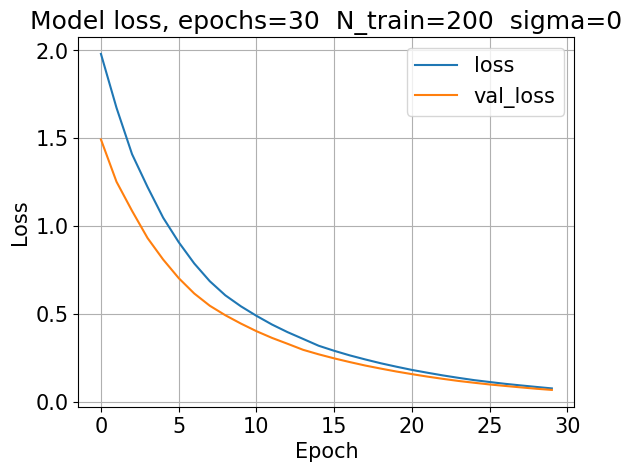

4/4 [==============================] - 0s 780us/step


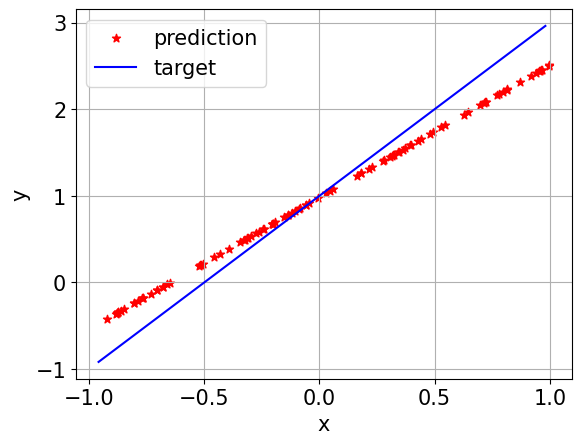

2/2 [==============================] - 0s 1ms/step - loss: 3.5432e-04 - mse: 3.5432e-04
target
Test loss: 0.00035431754076853395
Test accuracy: 0.00035431754076853395
coefficente angolare predizione [[1.9666235]]
termine noto predizione [0.9996725]


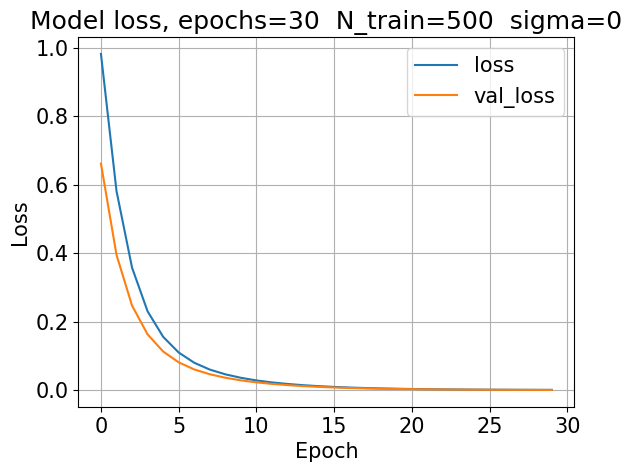

4/4 [==============================] - 0s 612us/step


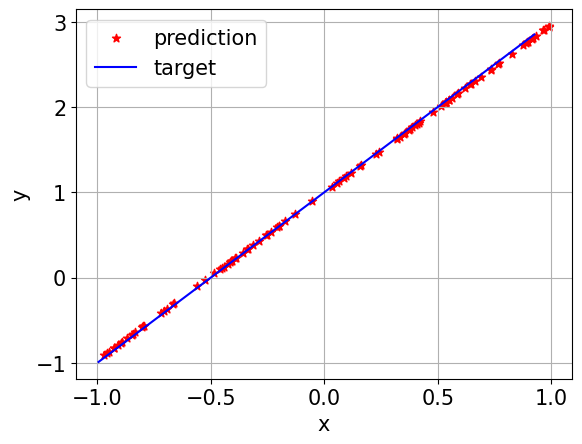

2/2 [==============================] - 0s 1ms/step - loss: 1.4216e-06 - mse: 1.4216e-06
target
Test loss: 1.4215967212294345e-06
Test accuracy: 1.4215967212294345e-06
coefficente angolare predizione [[1.9980053]]
termine noto predizione [0.99998343]


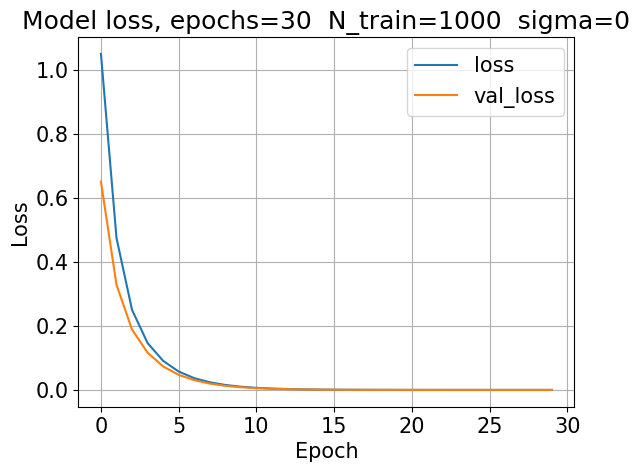

4/4 [==============================] - 0s 815us/step


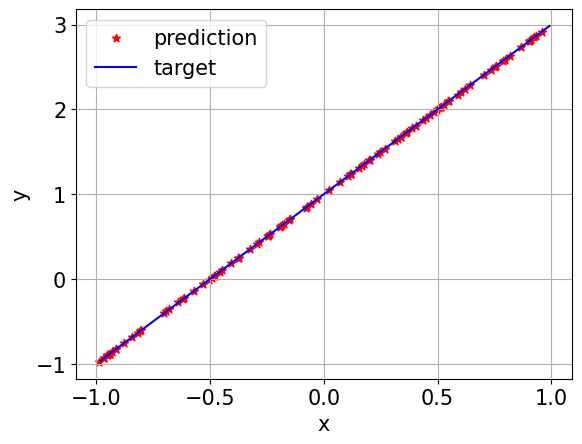

2/2 [==============================] - 0s 1ms/step - loss: 1.7046e-11 - mse: 1.7046e-11
target
Test loss: 1.704563226678779e-11
Test accuracy: 1.704563226678779e-11
coefficente angolare predizione [[1.999993]]
termine noto predizione [1.0000002]


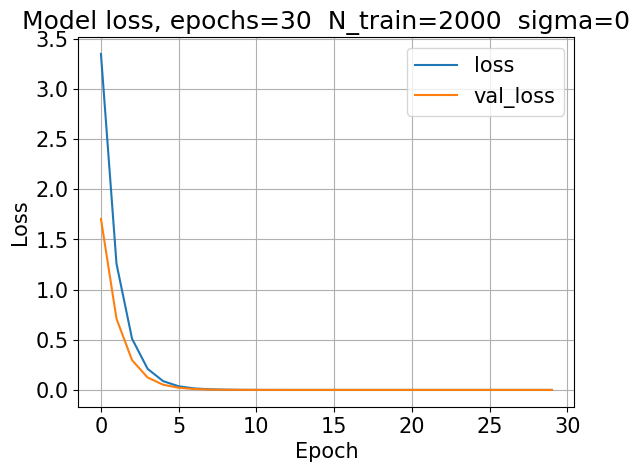

4/4 [==============================] - 0s 707us/step


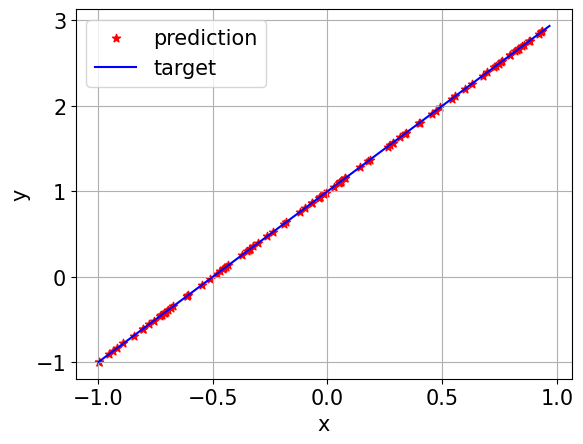

2/2 [==============================] - 0s 1ms/step - loss: 9.4045e-12 - mse: 9.4045e-12
target
Test loss: 9.40445811503654e-12
Test accuracy: 9.40445811503654e-12
coefficente angolare predizione [[1.9999943]]
termine noto predizione [1.]


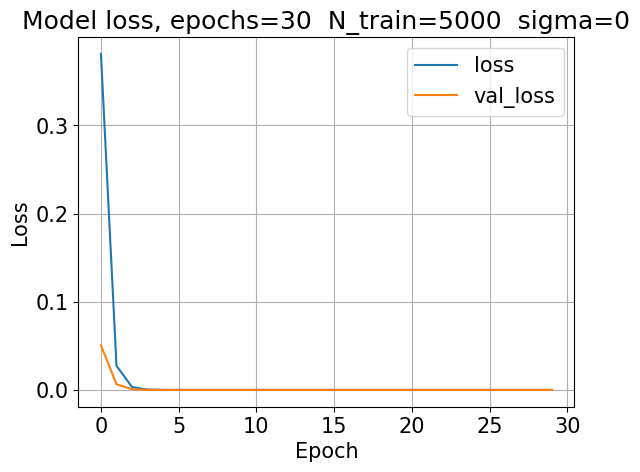

4/4 [==============================] - 0s 698us/step


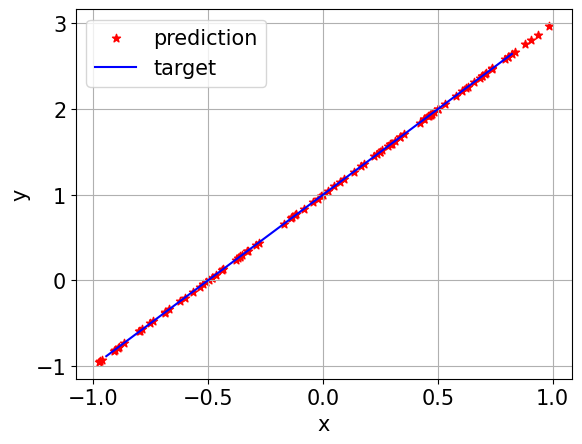

In [31]:
loss_epochs={}
loss_ntrain={}
loss_sigma={}
val_loss_epochs={}
val_loss_ntrain={}
val_loss_sigma={}
array_n_train = [200,500,1000,2000,5000]
for n_train in array_n_train:
    NN_model(30,n_train,0)

LAST LOSS VALUES
n_train: 200   loss: 0.07818081229925156
n_train: 500   loss: 0.0004275813407730311
n_train: 1000   loss: 1.700779080238135e-06
n_train: 2000   loss: 2.151921175974625e-11
n_train: 5000   loss: 1.1408425419634494e-11


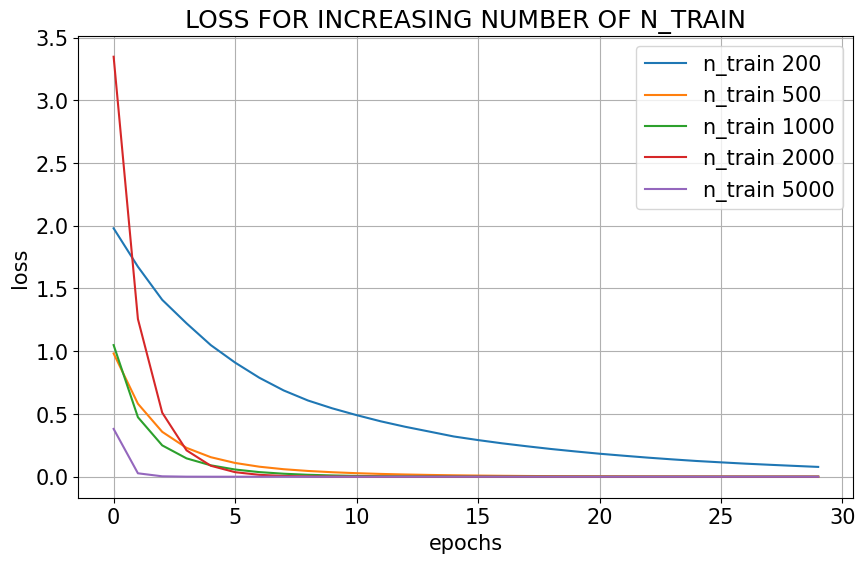

In [32]:
plt.figure(figsize=(10,6))
plt.ylabel("loss")
plt.xlabel("epochs")
plt.title("LOSS FOR INCREASING NUMBER OF N_TRAIN")
plt.grid()
print("LAST LOSS VALUES")
for n_train in array_n_train:
    plt.plot(loss_ntrain[f'loss_ntrain_{n_train}'],label=("n_train "+str(n_train)))
    print("n_train:",str(n_train),"  loss:",str(loss_ntrain[f'loss_ntrain_{n_train}'][-1]))
plt.legend();

LAST VAL_LOSS VALUES
n_train: 200   loss: 0.06958133727312088
n_train: 500   loss: 0.00035431754076853395
n_train: 1000   loss: 1.4215967212294345e-06
n_train: 2000   loss: 1.704563226678779e-11
n_train: 5000   loss: 9.40445811503654e-12


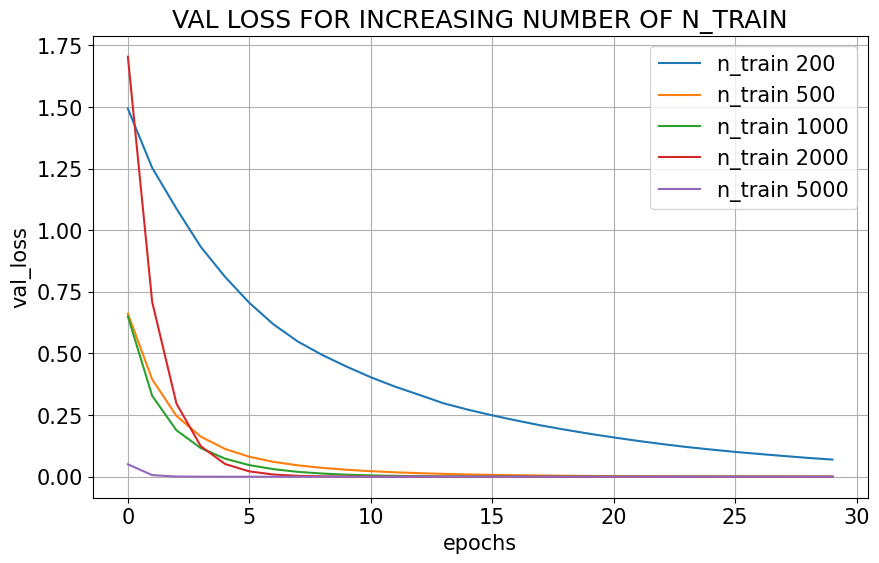

In [33]:
plt.figure(figsize=(10,6))
plt.ylabel("val_loss")
plt.xlabel("epochs")
plt.title("VAL LOSS FOR INCREASING NUMBER OF N_TRAIN")
plt.grid()
print("LAST VAL_LOSS VALUES")
for n_train in array_n_train:
    plt.plot(val_loss_ntrain[f'loss_ntrain_{n_train}'],label=("n_train "+str(n_train)))
    print("n_train:",str(n_train),"  loss:",str(val_loss_ntrain[f'loss_ntrain_{n_train}'][-1]))
plt.legend();

### VARYING SIGMA

2/2 [==============================] - 0s 1ms/step - loss: 1.5234e-04 - mse: 1.5234e-04
target
Test loss: 0.00015233705926220864
Test accuracy: 0.00015233705926220864
coefficente angolare predizione [[2.0074148]]
termine noto predizione [0.9887714]


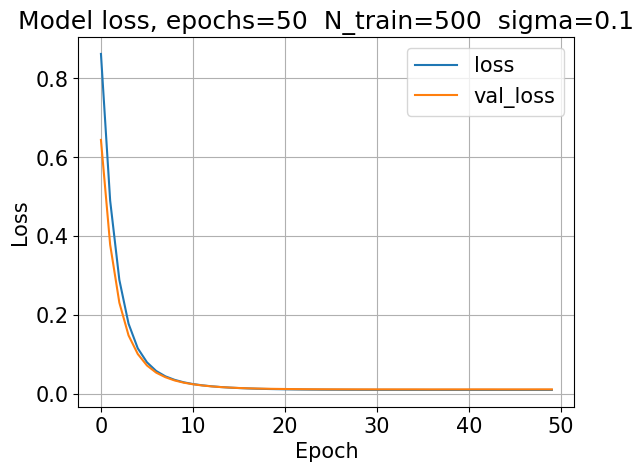

4/4 [==============================] - 0s 718us/step


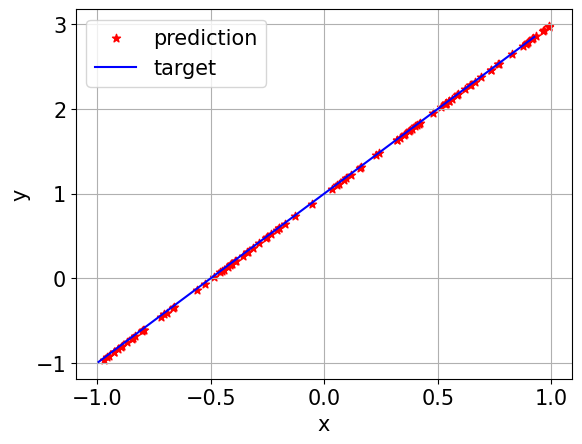

2/2 [==============================] - 0s 1ms/step - loss: 6.3211e-04 - mse: 6.3211e-04
target
Test loss: 0.0006321121472865343
Test accuracy: 0.0006321121472865343
coefficente angolare predizione [[2.0189831]]
termine noto predizione [0.9782309]


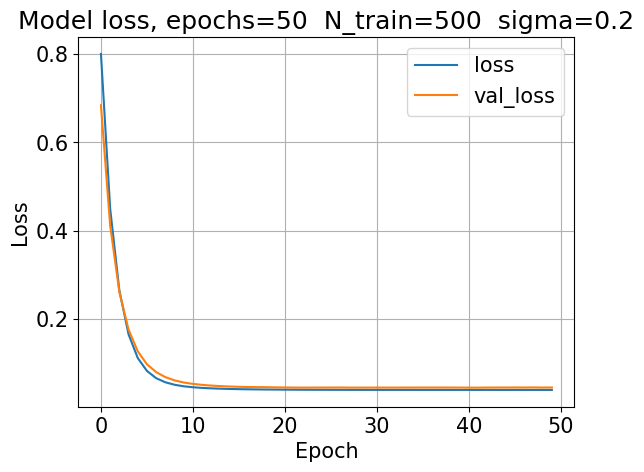

4/4 [==============================] - 0s 681us/step


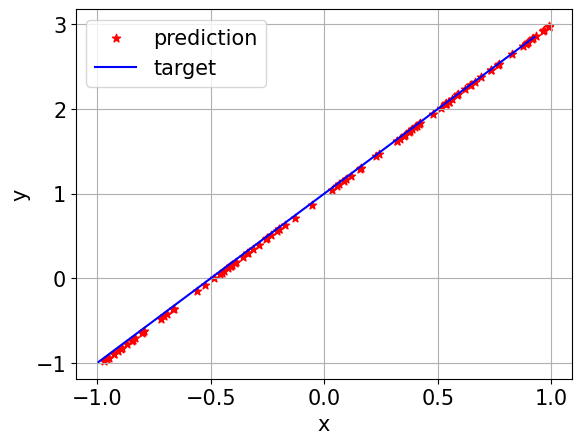

2/2 [==============================] - 0s 1ms/step - loss: 0.0030 - mse: 0.0030
target
Test loss: 0.0030467796605080366
Test accuracy: 0.0030467796605080366
coefficente angolare predizione [[2.0362935]]
termine noto predizione [0.9506144]


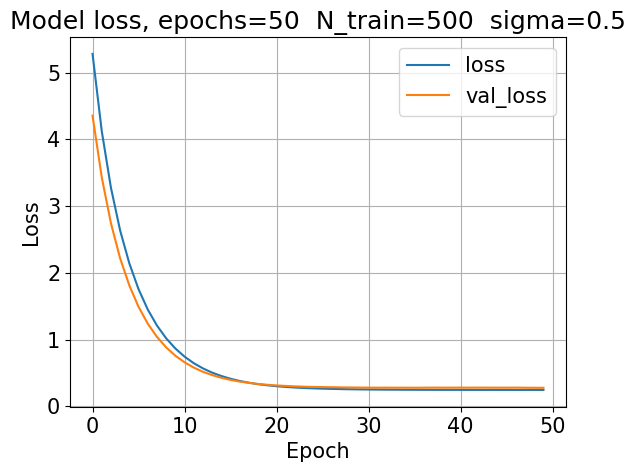

4/4 [==============================] - 0s 645us/step


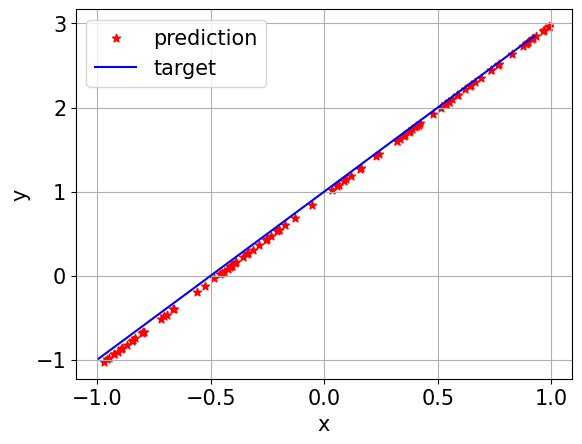

2/2 [==============================] - 0s 1ms/step - loss: 0.0076 - mse: 0.0076
target
Test loss: 0.0075988383032381535
Test accuracy: 0.0075988383032381535
coefficente angolare predizione [[2.0679731]]
termine noto predizione [0.92521524]


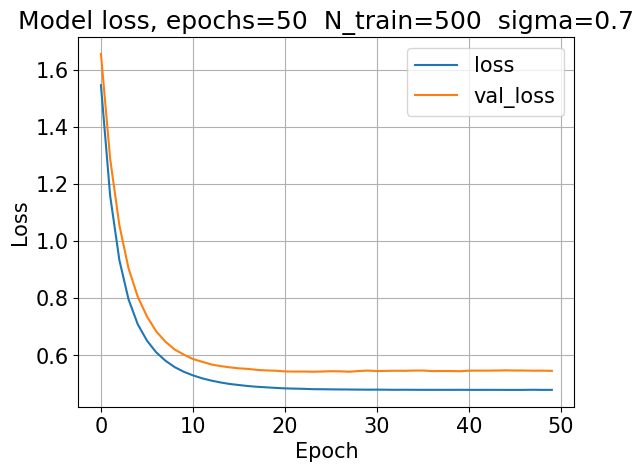

4/4 [==============================] - 0s 661us/step


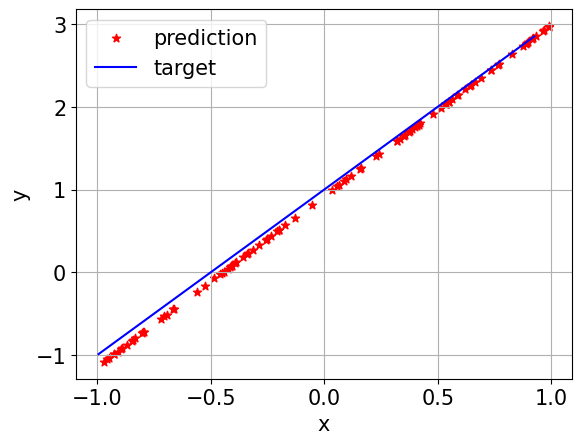

2/2 [==============================] - 0s 1ms/step - loss: 0.0168 - mse: 0.0168
target
Test loss: 0.01678377576172352
Test accuracy: 0.01678377576172352
coefficente angolare predizione [[2.1023185]]
termine noto predizione [0.8892835]


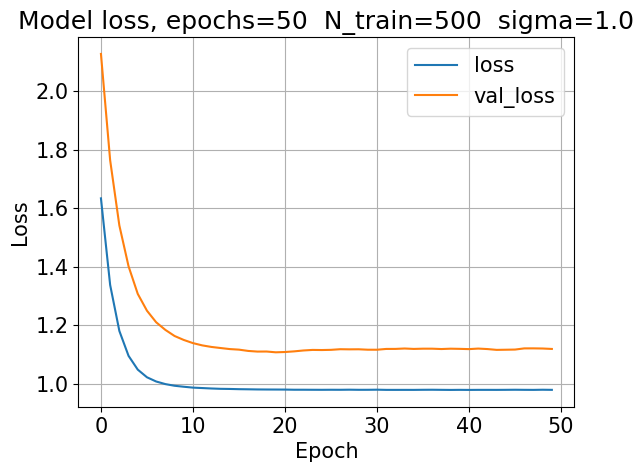

4/4 [==============================] - 0s 648us/step


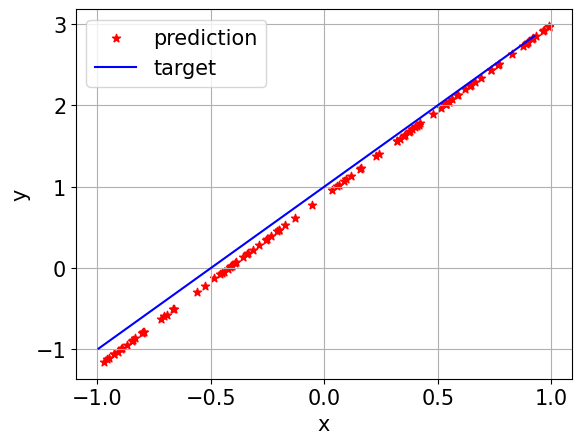

In [34]:
loss_epochs={}
loss_ntrain={}
loss_sigma={}
val_loss_epochs={}
val_loss_ntrain={}
val_loss_sigma={}
array_sigma = [0.1,0.2,0.5,0.7,1.00]
for sigma in array_sigma:
    NN_model(50,500,sigma)

LAST LOSS VALUES
sigma: 0.1       loss: 0.009787365794181824
sigma: 0.2       loss: 0.03914107382297516
sigma: 0.5       loss: 0.24472711980342865
sigma: 0.7       loss: 0.47962892055511475
sigma: 1.0       loss: 0.978438138961792


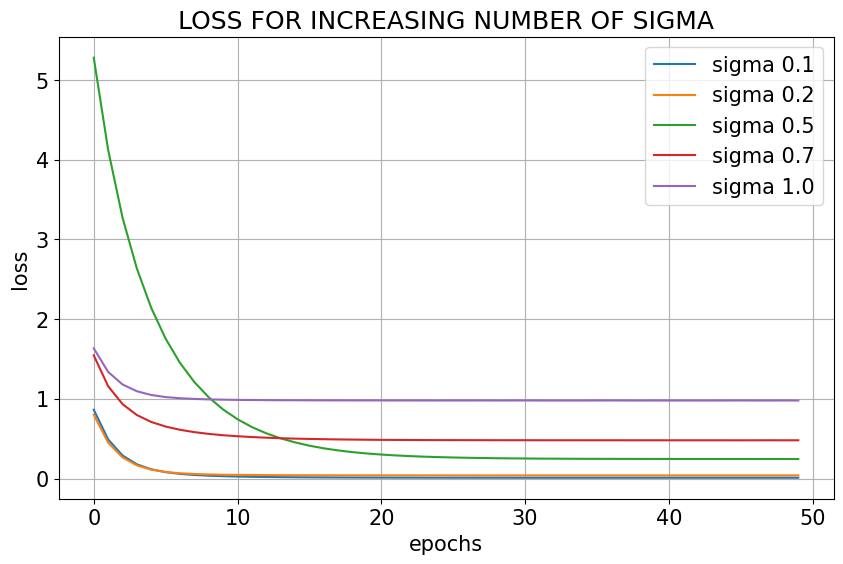

In [35]:
plt.figure(figsize=(10,6))
plt.ylabel("loss")
plt.xlabel("epochs")
plt.title("LOSS FOR INCREASING NUMBER OF SIGMA")
plt.grid()
print("LAST LOSS VALUES")
for sigma in array_sigma:
    plt.plot(loss_sigma[f'loss_sigma_{sigma}'],label=("sigma "+str(sigma)))
    print("sigma:",str(sigma),"      loss:",str(loss_sigma[f'loss_sigma_{sigma}'][-1]))
plt.legend();

LAST VAL LOSS VALUES
sigma: 0.1       loss: 0.011177677661180496
sigma: 0.2       loss: 0.04463978856801987
sigma: 0.5       loss: 0.27629339694976807
sigma: 0.7       loss: 0.5460019707679749
sigma: 1.0       loss: 1.1183273792266846


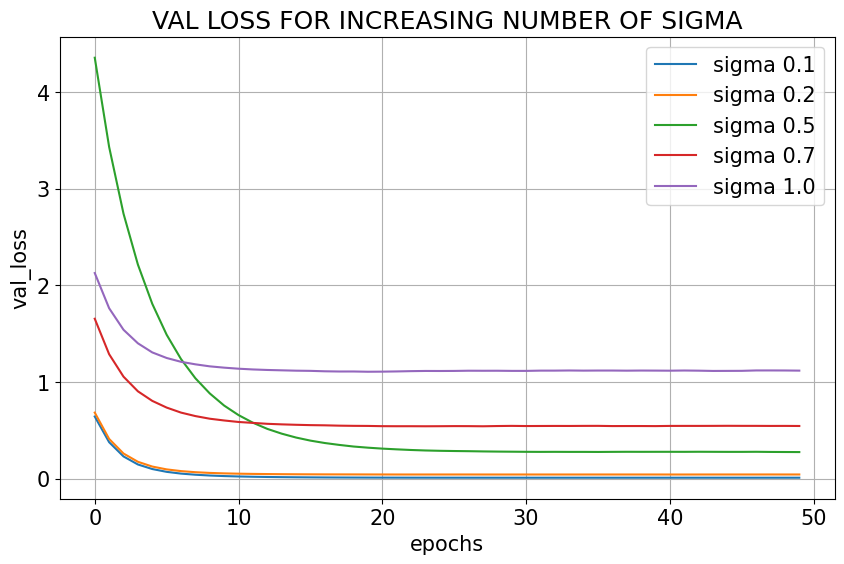

In [36]:
plt.figure(figsize=(10,6))
plt.ylabel("val_loss")
plt.xlabel("epochs")
plt.title("VAL LOSS FOR INCREASING NUMBER OF SIGMA")
plt.grid()
print("LAST VAL LOSS VALUES")
for sigma in array_sigma:
    plt.plot(val_loss_sigma[f'loss_sigma_{sigma}'],label=("sigma "+str(sigma)))
    print("sigma:",str(sigma),"      loss:",str(val_loss_sigma[f'loss_sigma_{sigma}'][-1]))
plt.legend();

### Conclusions

- **Increasing the number of epochs** is beneficial for the training loss, as the model continues to learn and minimize the loss on the training data. However, there is a risk of overfitting, where the model fits the training data too closely and fails to generalize well to new, unseen data.
- **Increasing the number of training samples (`N_train`)** generally leads to better model performance, similar to the effect of increasing epochs. With more data, the model can learn more effectively and generalize better. However, the same consideration regarding overfitting applies.
- **Increasing `sigma` (the noise standard deviation)** results in poorer performance. As noise is added to `y_train` and `y_validation`, both the training loss and validation loss tend to increase. The added noise makes it more challenging for the model to find the underlying pattern in the data, leading to higher loss values.

In summary:
- More epochs can improve training loss but may cause overfitting.
- More training samples can improve performance but with similar overfitting risks as more epochs.
- More noise (higher `sigma`) degrades model performance by increasing both training and validation loss.
- To prevent overfitting is possible to add a "callback" argument during the model fitting. This option stops the NN if for a selected number of epochs (patience) the val_loss don't decrease anymore

### Exercise 11.2

Try to extend the model to obtain a reasonable fit of the following polynomial of order 3:

$$
f(x)=4-3x-2x^2+3x^3
$$
for $x \in [-1,1]$.

Find good (& reasonable) choices for:

- the number of layers
- the number of neurons in each layer
- the activation function
- the optimizer
- the loss function
  
Check your NN model by seeing how well your fits predict newly generated test data (including on data outside the range you fit. How well do your NN do on points in the range of $x$ where you trained the model? How about points outside the original training data set? 
Summarize what you have learned about the relationship between model complexity (number of parameters), goodness of fit on training data, and the ability to predict well.

In [47]:
def NN_model(activation,loss,optimizer,n_layers,n_neurons):   
    
    # target parameters of f(x) = a+ b*x + c*x^2 + d*x^3
    a = 4 
    b = -3 
    c = -2
    d = 3
    def f(x):
        return a*x**3 + b*x**2 + c*x + d 

    # generate training inputs
    np.random.seed(0)
    x_train = np.random.uniform(-1, 1, 600)
    x_valid = np.random.uniform(-1, 1, 100)
    x_valid.sort()
    x_test = np.random.uniform(-1, 1, 200)  # to fit complete function in [-1,1]
    x_test.sort()
    y_target =  f(x_test) # ideal (target) linear function

    sigma = 0.05 # noise standard deviation
    y_train = np.random.normal(f(x_train), sigma) # actual measures from which we want to guess regression parameters
    y_valid = np.random.normal(f(x_valid), sigma)

    
    
    model = tf.keras.Sequential()
    model.add(Dense(n_neurons, activation=activation, input_shape=(1,)))
    for i in range(n_layers):
        model.add(Dense(n_neurons, activation = activation ) )
    model.add(Dense(1, activation=activation))

    # compile the model choosing optimizer, loss and metrics objects
    model.compile(optimizer=optimizer, loss=loss, metrics=['mse'])
    #callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=20)
    history = model.fit(x=x_train, y=y_train, epochs=30, shuffle=True,batch_size=32,
                            validation_data=(x_valid, y_valid),verbose=False)
    #history = model.fit(x=x_train, y=y_train, epochs=50, shuffle=True, callbacks=[callback],batch_size=32,
     #                       validation_data=(x_valid, y_valid),verbose=False)

    

   

    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(12, 5))
    plt.suptitle('Model loss: layers='+str(n_layers)+"  nodi="+str(n_neurons)+"  activation="+str(activation)
                 +"  loss="+str(loss)+"  optimizer="+str(optimizer))
    # Plot dei valori di loss di addestramento e validazione
    ax1.plot(history.history['loss'], label="loss")
    ax1.plot(history.history['val_loss'], label="val_loss")
    ax1.set_ylabel('Loss')
    ax1.set_xlabel('Epoch')
    ax1.legend(loc='best')
    ax1.grid()

    # Predizione con il modello addestrato
    x_predicted = np.random.uniform(-1, 1, 100)
    y_predicted = model.predict(x_predicted)
    ax2.scatter(x_predicted, y_predicted, color='r', label='prediction', marker="*")
    ax2.plot(x_test, y_target, label='target', color="blue")
    ax2.set_xlabel("x")
    ax2.set_ylabel("y")
    ax2.legend()
    ax2.grid(True)
    
    # Predizione con il modello addestrato fuori dai margini [-1,1]
    x_predicted_out = np.random.uniform(-2, 2, 100)
    y_predicted_out = model.predict(x_predicted_out)
    x_test_out = np.random.uniform(-2, 2, 200)  # to fit complete function in [-1,1]
    x_test_out.sort()
    y_target_out =  f(x_test_out) # ideal (target) linear function
    
    ax3.scatter(x_predicted_out, y_predicted_out, color='r', label='prediction', marker="*")
    ax3.plot(x_test_out, y_target_out, label='target', color="blue")
    ax3.axvline(x=-1,color='black',linewidth=0.8,ls="--")
    ax3.axvline(x=1,color='black',linewidth=0.8,ls="--")
    ax3.set_xlabel("x")
    ax3.set_ylabel("y")
    ax3.legend()
    ax3.grid(True)

    plt.tight_layout()
    plt.show()

### VARYING NUMBER OF LAYERS

4/4 [==============================] - 0s 493us/step


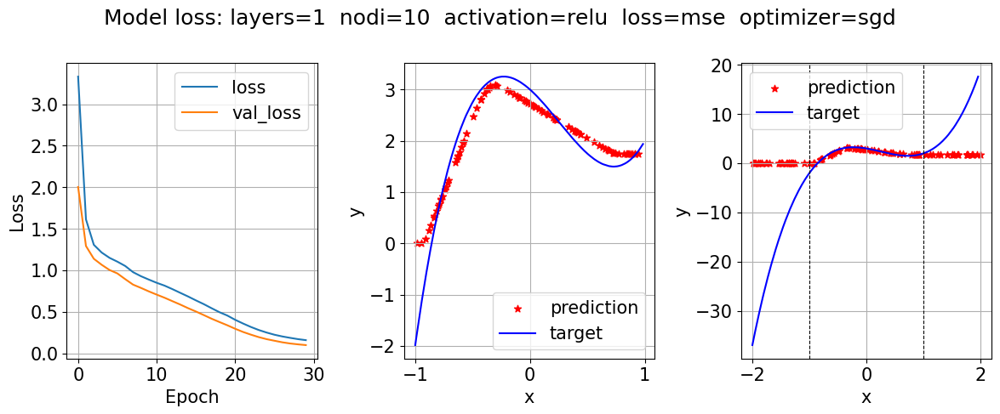

4/4 [==============================] - 0s 507us/step


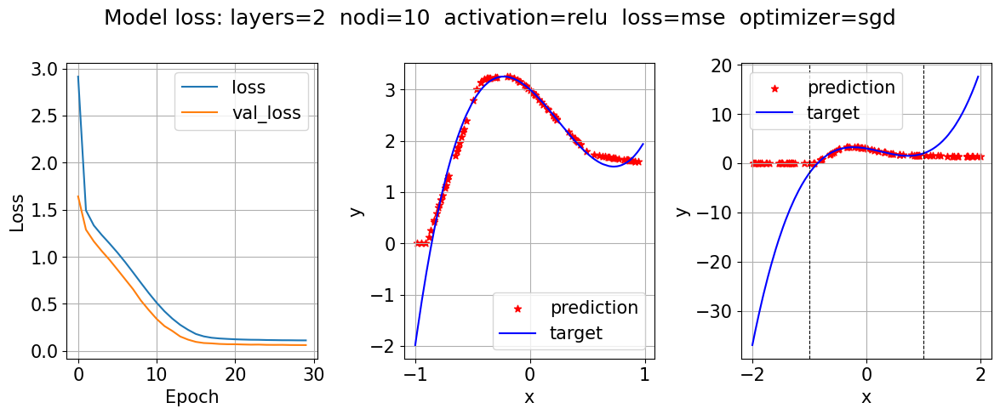

4/4 [==============================] - 0s 548us/step


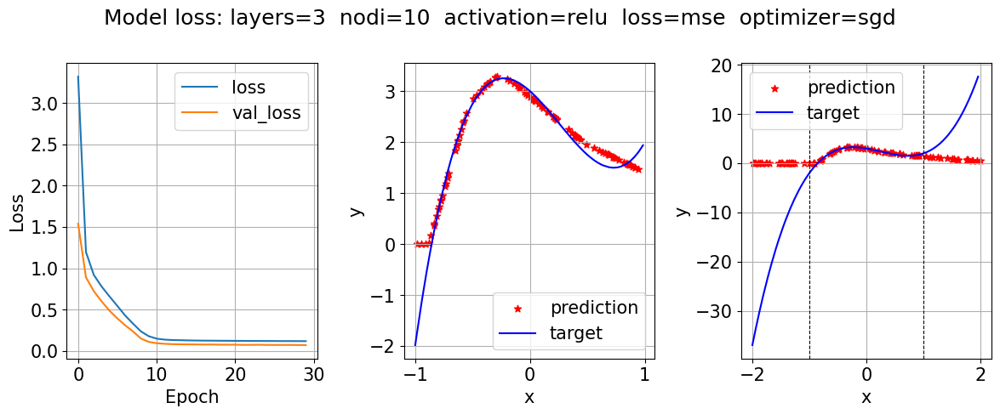

4/4 [==============================] - 0s 524us/step


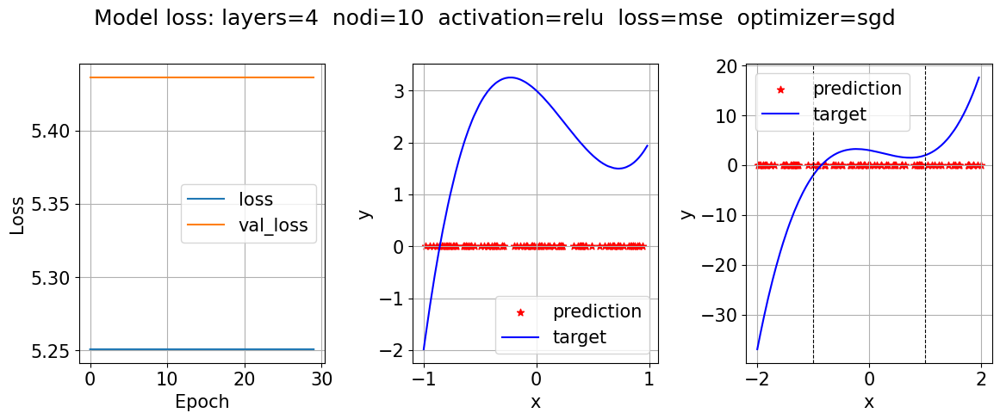

4/4 [==============================] - 0s 832us/step


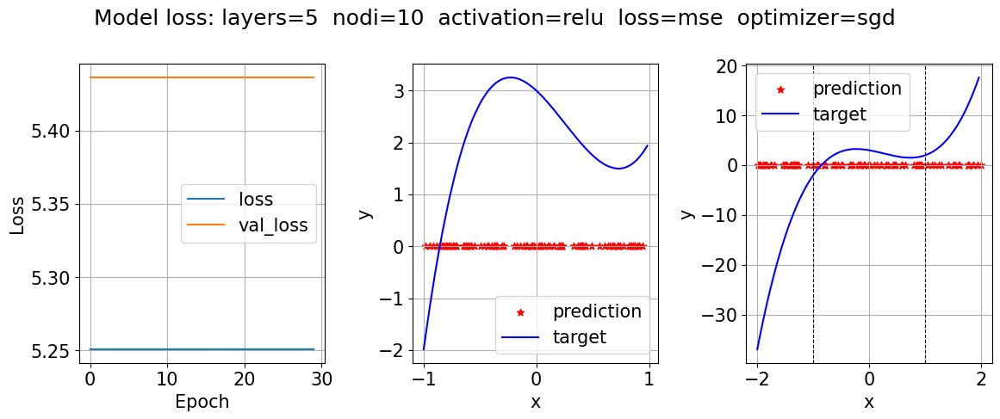

4/4 [==============================] - 0s 561us/step


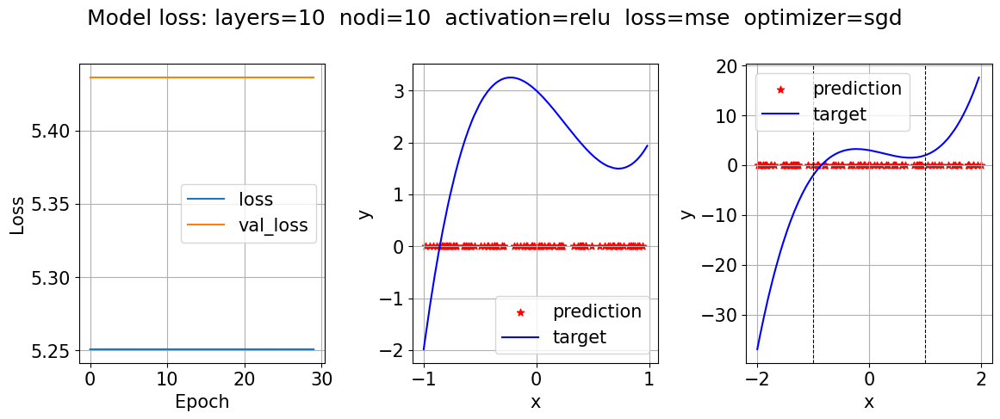

4/4 [==============================] - 0s 554us/step


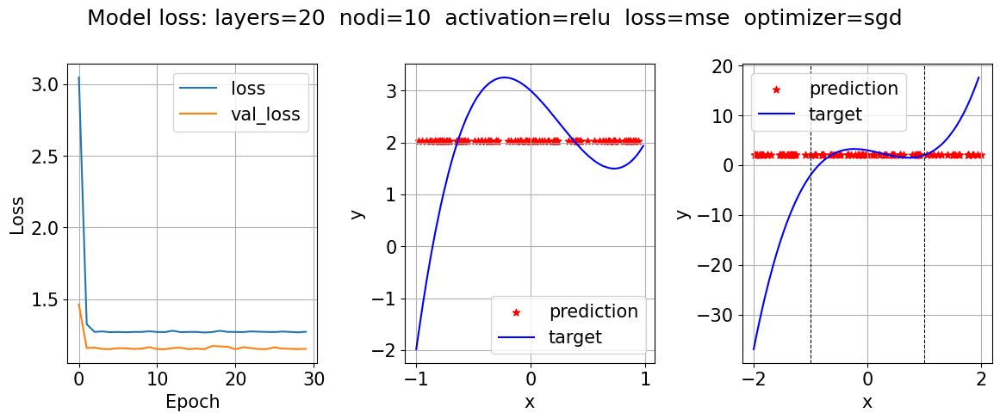

In [48]:
layers = [1,2,3,4,5,10,20]
for n_layers in layers:
    NN_model("relu","mse","sgd",n_layers,10)

### VARYING NUMBER OF NODES

4/4 [==============================] - 0s 509us/step


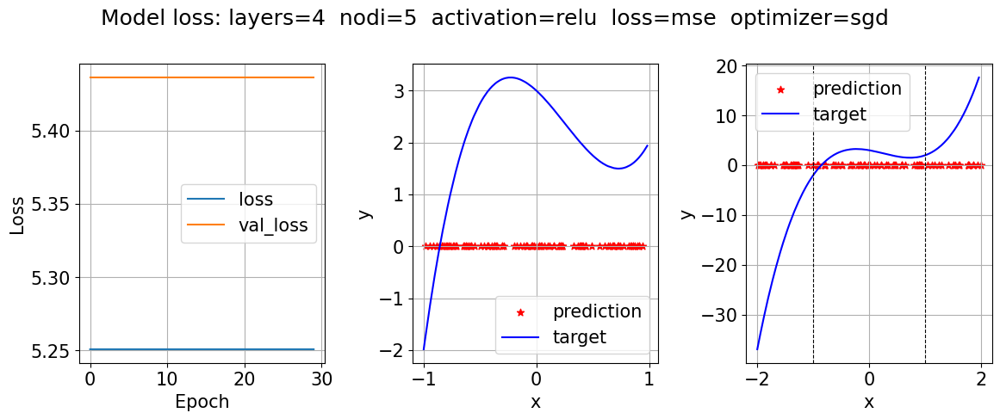

4/4 [==============================] - 0s 476us/step


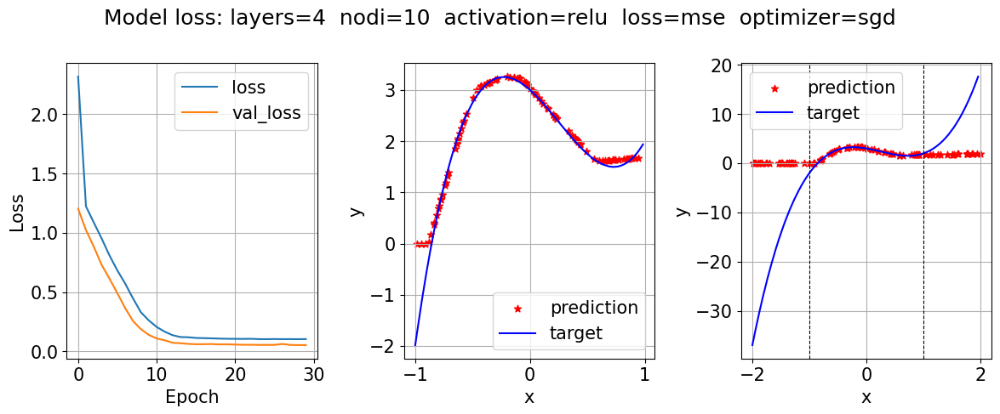

4/4 [==============================] - 0s 513us/step


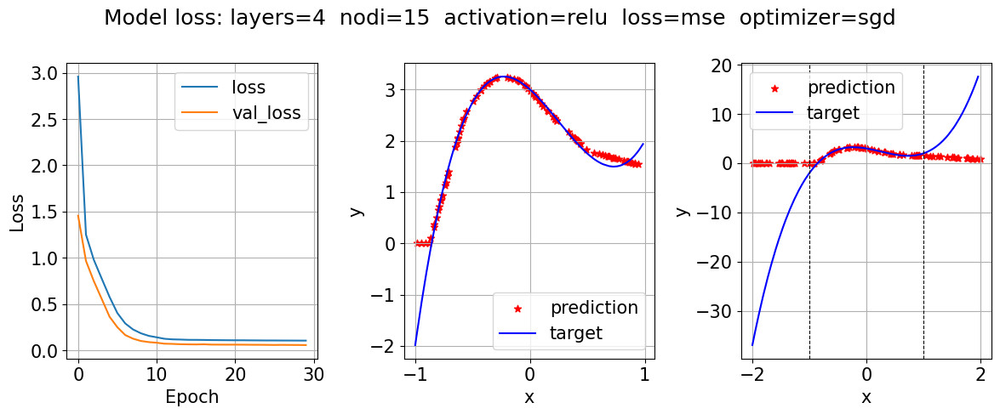

4/4 [==============================] - 0s 457us/step


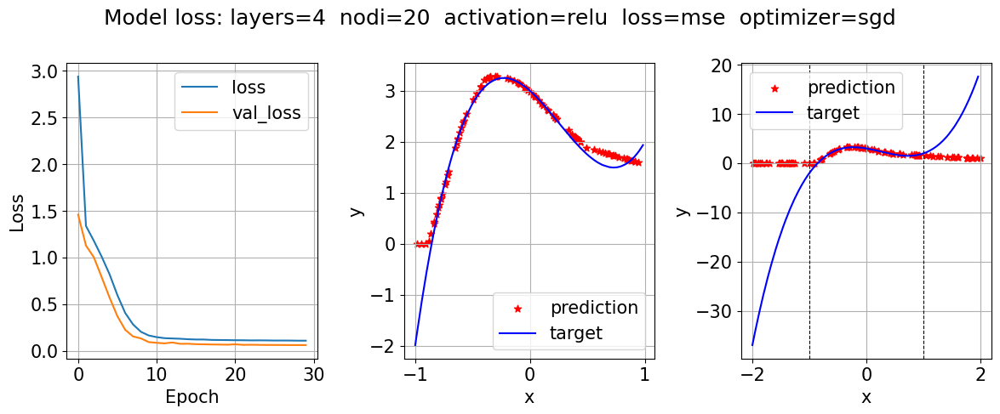

4/4 [==============================] - 0s 479us/step


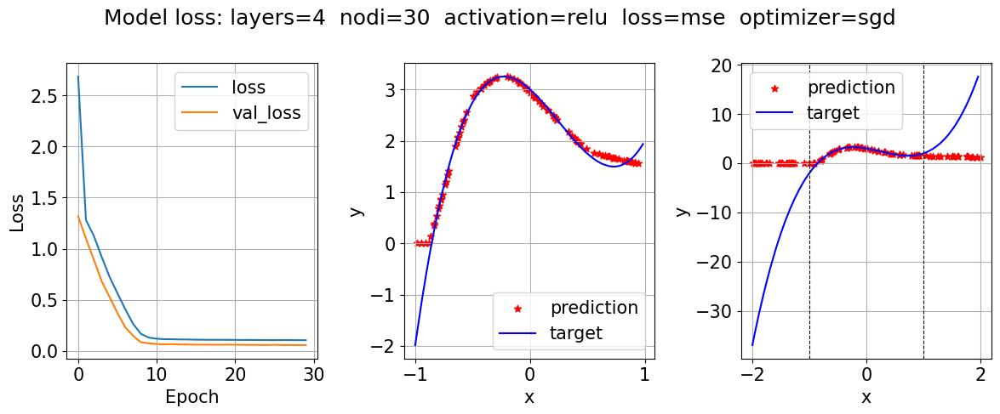

4/4 [==============================] - 0s 516us/step


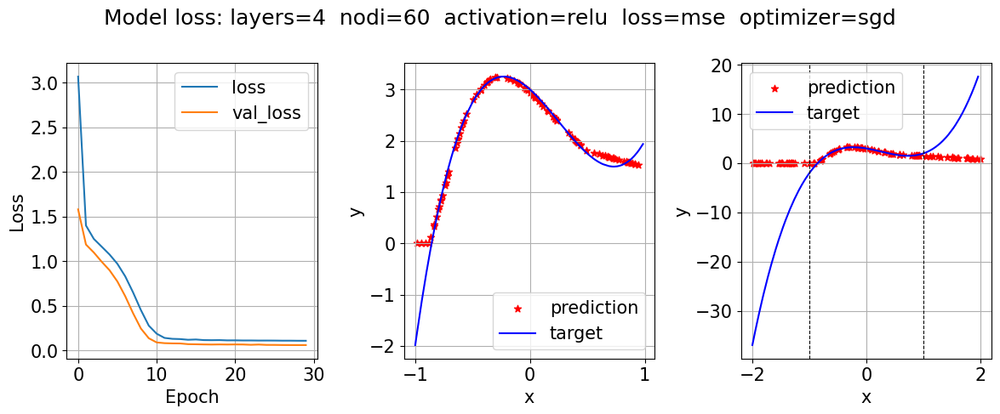

In [49]:
nodes = [5,10,15,20,30,60]
for n_nodes in nodes:
    NN_model("relu","mse","sgd",4,n_nodes)

### VARYING ACTIVATION FUNCTION

4/4 [==============================] - 0s 564us/step


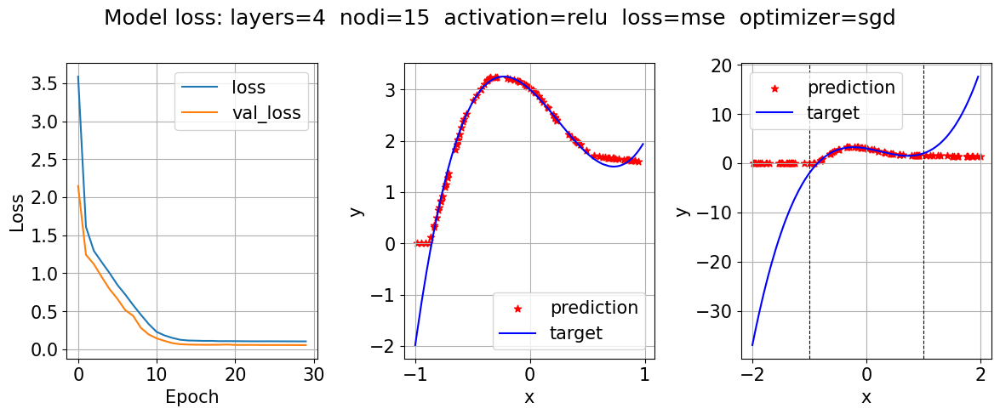

4/4 [==============================] - 0s 539us/step


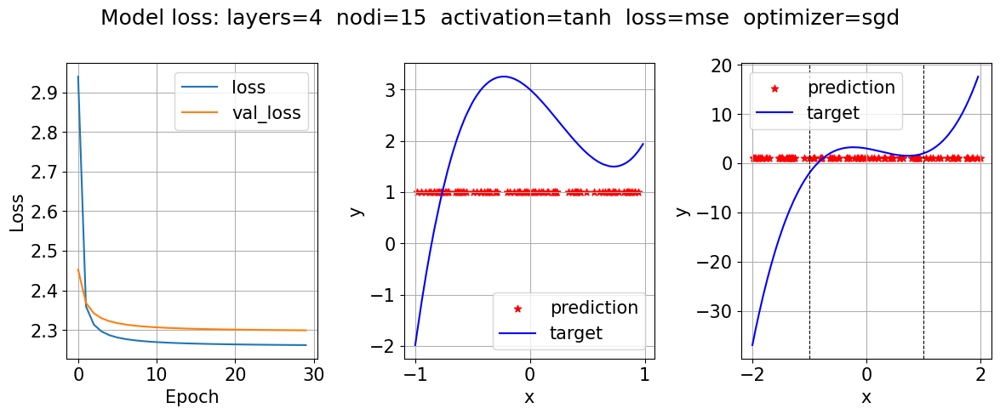

4/4 [==============================] - 0s 521us/step


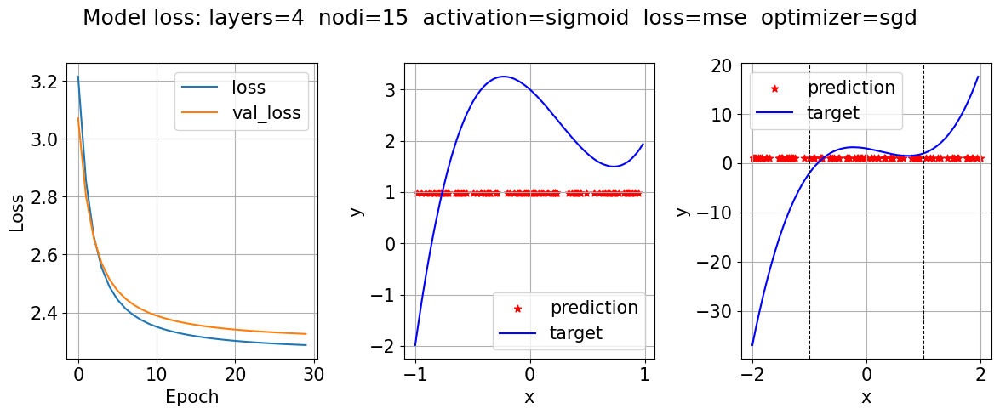

4/4 [==============================] - 0s 511us/step


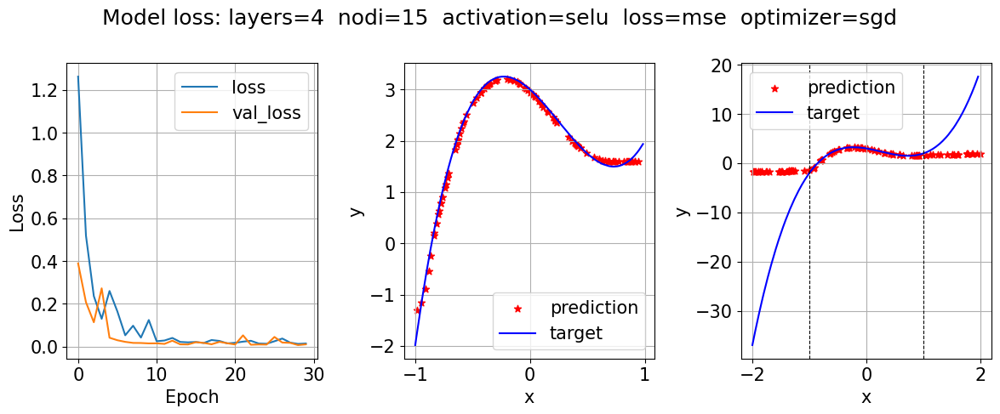

4/4 [==============================] - 0s 529us/step


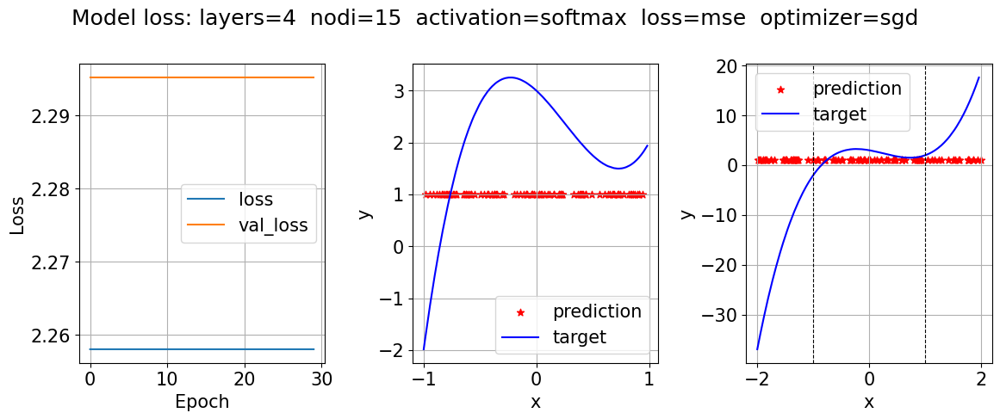

In [52]:
activations = ["relu","tanh","sigmoid","selu","softmax"]
for act in activations:
    NN_model(act,"mse","sgd",4,15)

### VARYING LOSS FUNCTION

4/4 [==============================] - 0s 545us/step


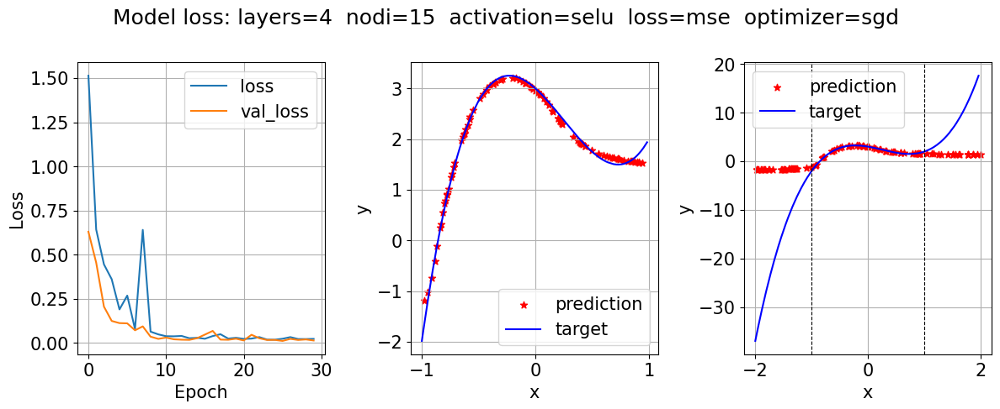

4/4 [==============================] - 0s 504us/step


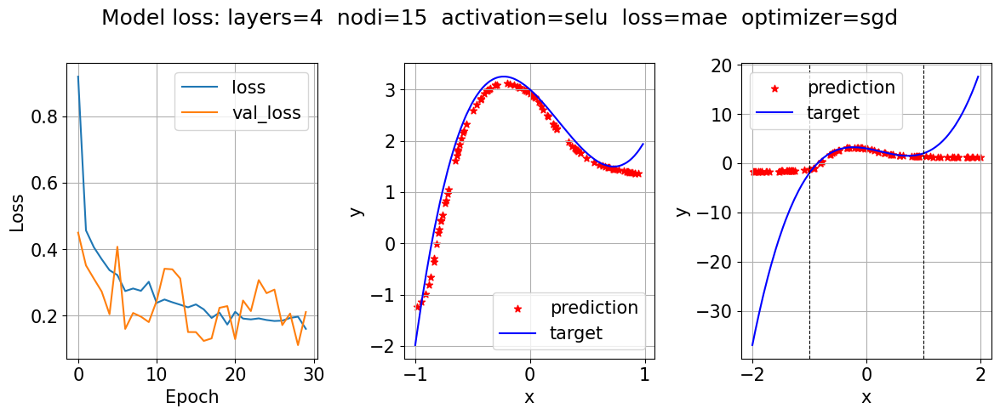

4/4 [==============================] - 0s 528us/step


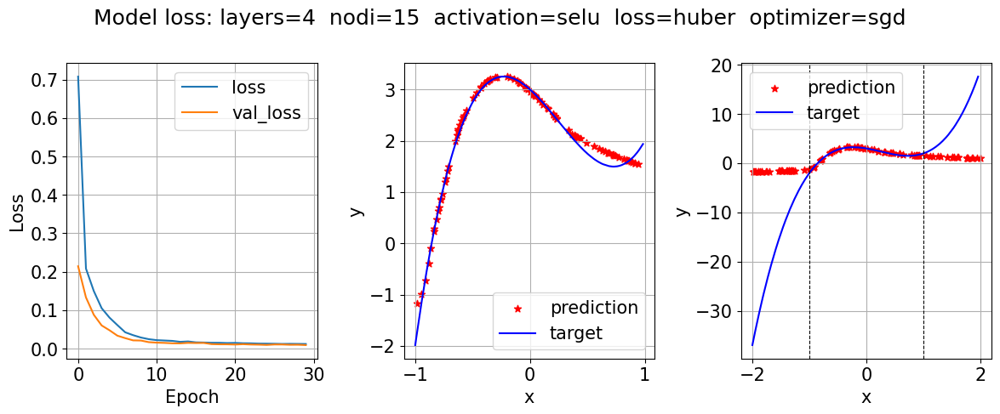

In [53]:
losses = ["mse","mae","huber"]
for loss in losses:
    NN_model("selu",loss,"sgd",4,15)

###  VARYING OPTIMIZER

4/4 [==============================] - 0s 614us/step


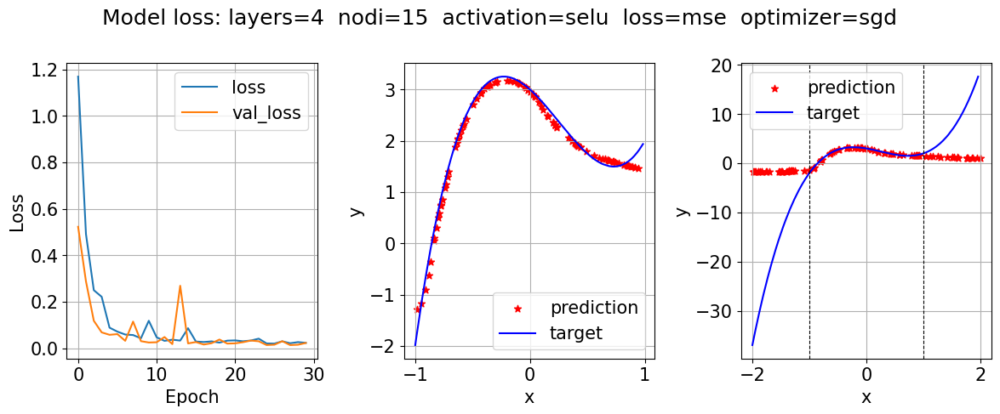

4/4 [==============================] - 0s 518us/step


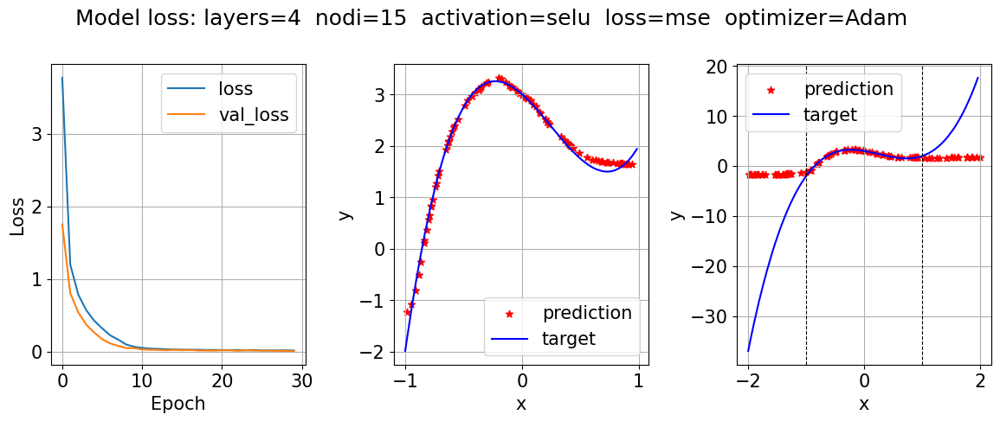

4/4 [==============================] - 0s 690us/step


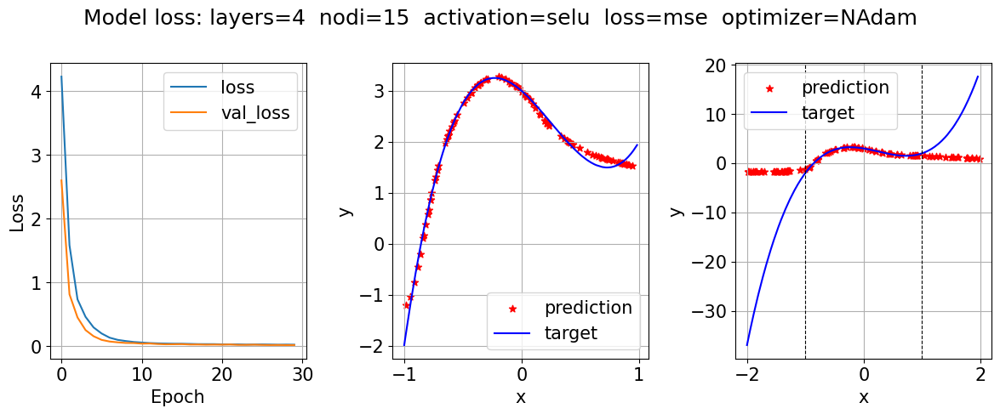

4/4 [==============================] - 0s 517us/step


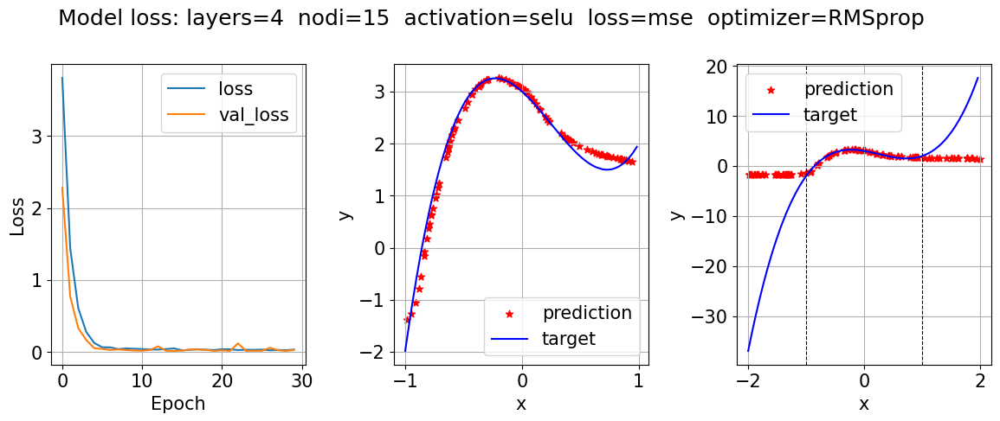

4/4 [==============================] - 0s 528us/step


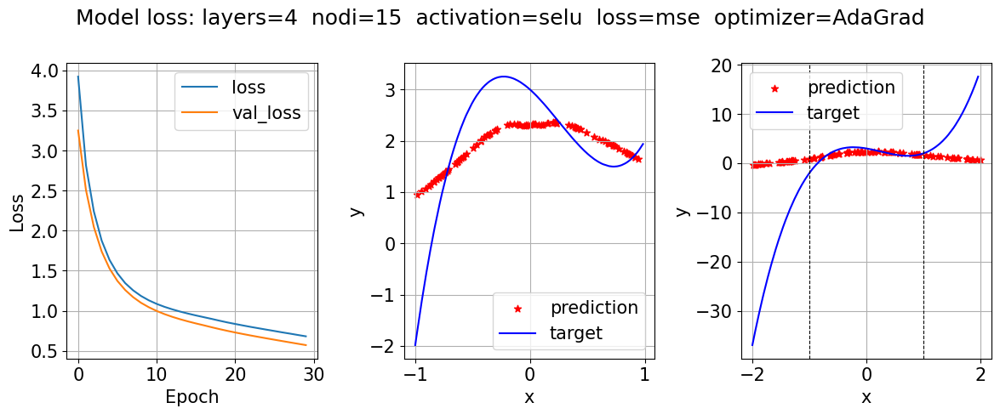

4/4 [==============================] - 0s 555us/step


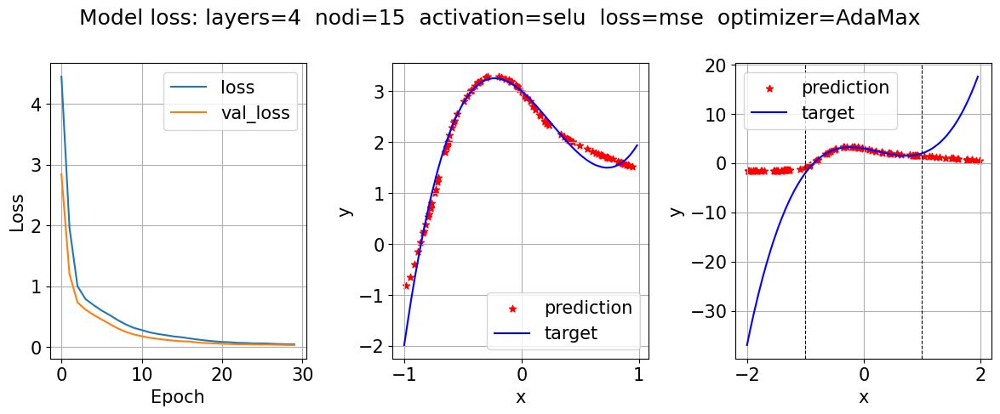

In [59]:
optimizer = ["sgd","Adam","NAdam","RMSprop","AdaGrad","AdaMax"]
for opt in optimizer:
    NN_model("selu","mse",opt,4,15)

### NOW I WILL TRY TO MAKE THE BEST CONFIGURATION ADDING VARIATION OF LEARNING RATE FOR ADAM OPTIMIZER

In [73]:
def NN_model(activation,loss,optimizer,n_layers,n_neurons,rate):   
    
    # target parameters of f(x) = a+ b*x + c*x^2 + d*x^3
    a = 4 
    b = -3 
    c = -2
    d = 3
    def f(x):
        return a*x**3 + b*x**2 + c*x + d 

    # generate training inputs
    np.random.seed(0)
    x_train = np.random.uniform(-1, 1, 600)
    x_valid = np.random.uniform(-1, 1, 100)
    x_valid.sort()
    x_test = np.random.uniform(-1, 1, 200)  # to fit complete function in [-1,1]
    x_test.sort()
    y_target =  f(x_test) # ideal (target) linear function

    sigma = 0.05 # noise standard deviation
    y_train = np.random.normal(f(x_train), sigma) # actual measures from which we want to guess regression parameters
    y_valid = np.random.normal(f(x_valid), sigma)

    
    
    model = tf.keras.Sequential()
    model.add(Dense(n_neurons, activation=activation, input_shape=(1,)))
    for i in range(n_layers):
        model.add(Dense(n_neurons, activation = activation ) )
    model.add(Dense(1, activation=activation))

    # compile the model choosing optimizer, loss and metrics objects
    model.compile(optimizer=tf.optimizers.Adam(learning_rate=rate), loss=loss, metrics=['mse'])
    callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=5)
    #history = model.fit(x=x_train, y=y_train, epochs=30, shuffle=True,batch_size=32,
     #                       validation_data=(x_valid, y_valid),verbose=False)
    history = model.fit(x=x_train, y=y_train, epochs=50, shuffle=True, callbacks=[callback],batch_size=32,
                            validation_data=(x_valid, y_valid),verbose=False)

    

   

    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(12, 5))
    plt.suptitle('Model loss: layers='+str(n_layers)+"  nodi="+str(n_neurons)+"  activation="+str(activation)
                 +"  loss="+str(loss)+"  optimizer="+str(optimizer)+"  l_rate="+str(rate))
    # Plot dei valori di loss di addestramento e validazione
    ax1.plot(history.history['loss'], label="loss")
    ax1.plot(history.history['val_loss'], label="val_loss")
    ax1.set_ylabel('Loss')
    ax1.set_xlabel('Epoch')
    ax1.legend(loc='best')
    ax1.grid()

    # Predizione con il modello addestrato
    x_predicted = np.random.uniform(-1, 1, 100)
    y_predicted = model.predict(x_predicted)
    ax2.scatter(x_predicted, y_predicted, color='r', label='prediction', marker="*")
    ax2.plot(x_test, y_target, label='target', color="blue")
    ax2.set_xlabel("x")
    ax2.set_ylabel("y")
    ax2.legend()
    ax2.grid(True)
    
    # Predizione con il modello addestrato fuori dai margini [-1,1]
    x_predicted_out = np.random.uniform(-2, 2, 100)
    y_predicted_out = model.predict(x_predicted_out)
    x_test_out = np.random.uniform(-2, 2, 200)  # to fit complete function in [-1,1]
    x_test_out.sort()
    y_target_out =  f(x_test_out) # ideal (target) linear function
    
    ax3.scatter(x_predicted_out, y_predicted_out, color='r', label='prediction', marker="*")
    ax3.plot(x_test_out, y_target_out, label='target', color="blue")
    ax3.axvline(x=-1,color='black',linewidth=0.8,ls="--")
    ax3.axvline(x=1,color='black',linewidth=0.8,ls="--")
    ax3.set_xlabel("x")
    ax3.set_ylabel("y")
    ax3.legend()
    ax3.grid(True)

    plt.tight_layout()
    plt.show()

4/4 [==============================] - 0s 514us/step


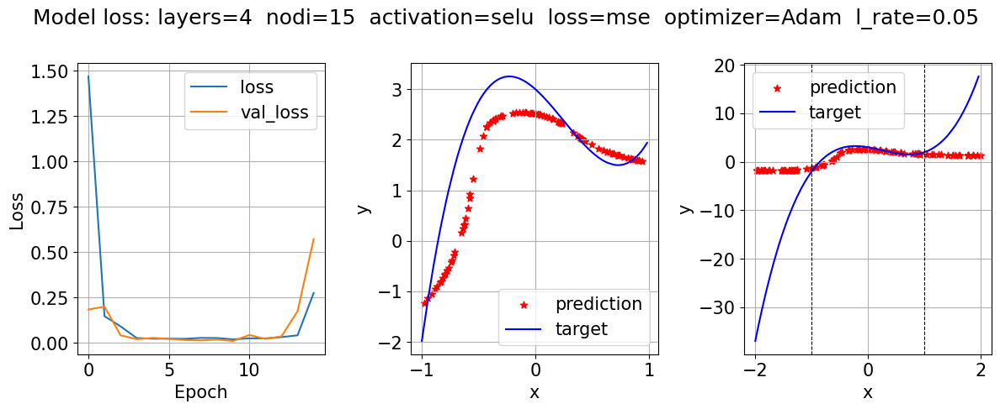

4/4 [==============================] - 0s 595us/step


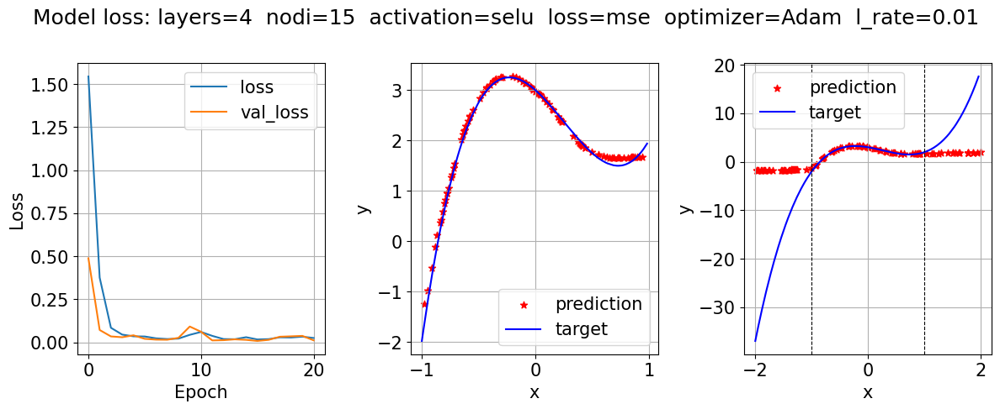

4/4 [==============================] - 0s 601us/step


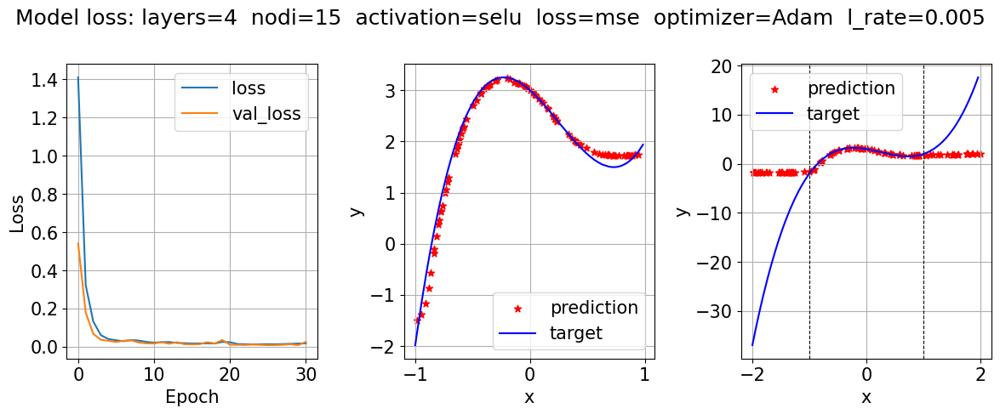

4/4 [==============================] - 0s 522us/step


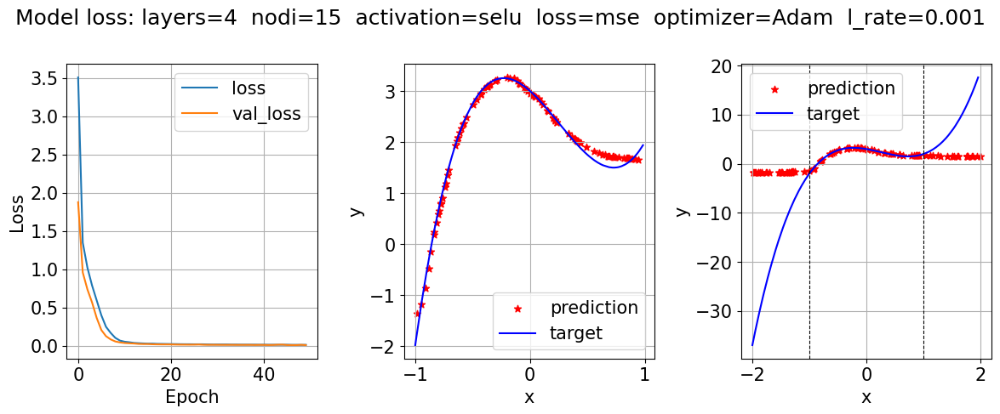

4/4 [==============================] - 0s 555us/step


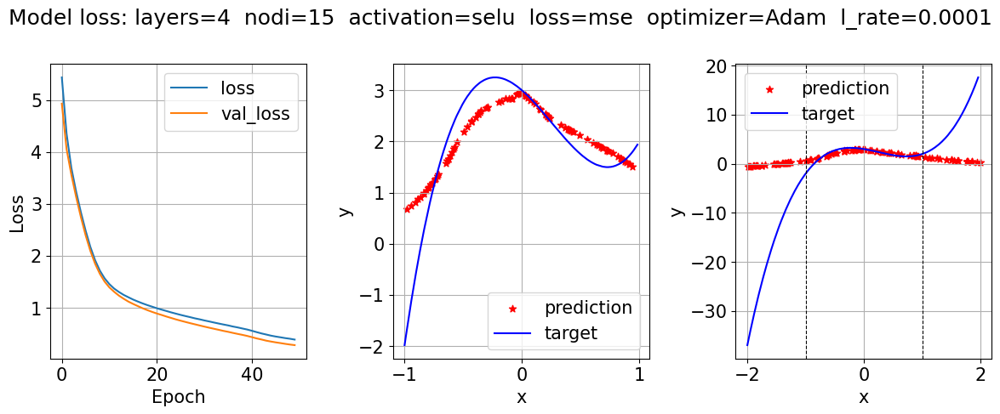

In [75]:
l_rate = [0.05,0.01,0.005,0.001,0.0001]
for rate in l_rate:
    NN_model("selu","mse","Adam",4,15,rate)

- It's impossible to predict out of the "train bounds" because there are infinty possibilities of functions trend

### Exercise 11.3
  
Try to extend the model to fit a simple trigonometric 2D function such as $f(x,y) = \sin(x^2+y^2)$ in the range $x \in [-3/2,3/2]$ and $y \in [-3/2,3/2]$.

In [151]:
def f(x,y):
    return np.sin(x**2 + y**2)

np.random.seed(0)
x_train = np.random.uniform(-1.5, 1.5, 500)
y_train = np.random.uniform(-1.5,1.5,500)
x_valid = np.random.uniform(-1.5, 1.5, 50)
y_valid = np.random.uniform(-1.5, 1.5, 50)

x_valid.sort()
y_valid.sort()

z_target =  f(x_valid,y_valid) # ideal (target) linear function

sigma = 0.2 # noise standard deviation
z_train = np.random.normal(f(x_train,y_train), sigma) # actual measures from which we want to guess regression parameters
z_valid = np.random.normal(f(x_valid,y_valid), sigma)

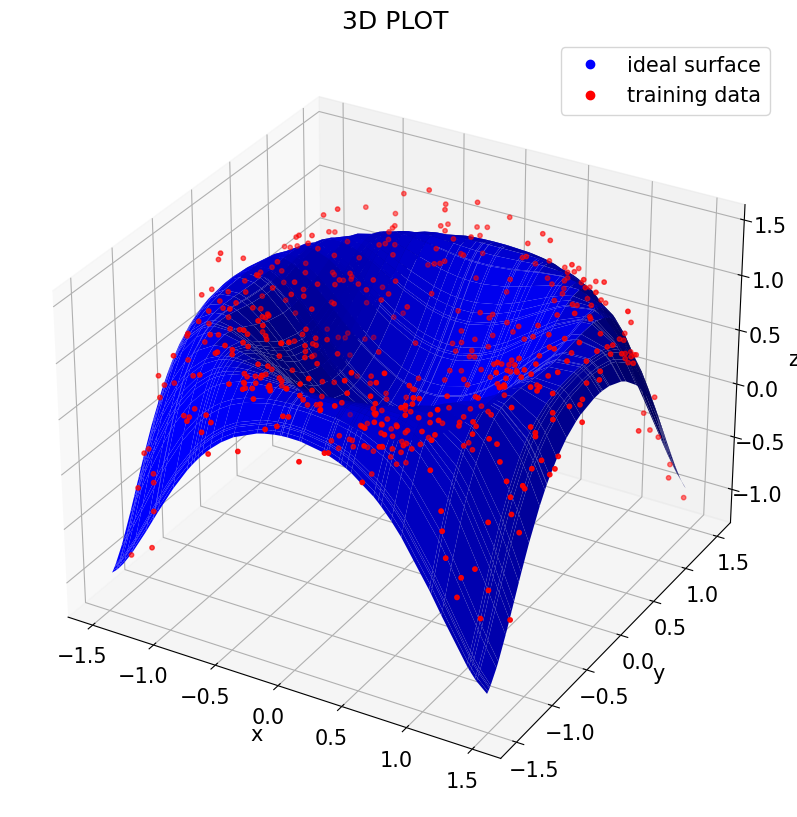

In [196]:
X,Y = np.meshgrid(x_valid,y_valid)
fig = plt.figure(figsize = (16, 10))
ax = plt.axes(projection='3d')
ax.plot_surface(X, Y, f(X, Y), color="b")
ax.scatter(x_train, y_train, z_train, color='r', s=10)
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('z')
ax.set_title("3D PLOT")

# Crea una finta 'linea' per la legenda della superficie
fake2Dline = plt.Line2D([0], [0], linestyle="none", c='b', marker='o')
fake3Dscatter = plt.Line2D([0], [0], linestyle="none", c='r', marker='o')

# Aggiungi la legenda
ax.legend([fake2Dline, fake3Dscatter], ['ideal surface', 'training data'])

plt.show()

In [210]:
def NN_model(activation,loss,optimizer,n_layers,n_neurons):   
    
    model = tf.keras.Sequential()
    model.add(Dense(n_neurons, activation=activation, input_shape=(2,)))
    for i in range(n_layers):
        model.add(Dense(n_neurons, activation = activation, input_shape=(2,) ) )
    model.add(Dense(1, activation=activation))

    # compile the model choosing optimizer, loss and metrics objects
    model.compile(optimizer=optimizer, loss=loss, metrics=['mse'])
    callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=5)
    #history = model.fit(x=x_train, y=y_train, epochs=30, shuffle=True,batch_size=32,
     #                       validation_data=(x_valid, y_valid),verbose=False)
    history = model.fit(x=np.array([x_train,y_train]).T, y= z_train, epochs=50, shuffle=True, callbacks=[callback],batch_size=32,
                            validation_data=(np.array([x_valid, y_valid]).T ,z_valid) ,verbose=True)

    

   

    fig = plt.figure(figsize=(14, 6))
    plt.suptitle('Model loss: layers='+str(n_layers)+"  nodi="+str(n_neurons)+"  activation="+str(activation)
                 +"  loss="+str(loss)+"  optimizer="+str(optimizer))
    # Plot dei valori di loss di addestramento e validazione
    ax1=fig.add_subplot(121)
    ax1.plot(history.history['loss'], label="loss")
    ax1.plot(history.history['val_loss'], label="val_loss")
    ax1.set_ylabel('Loss')
    ax1.set_xlabel('Epoch')
    ax1.legend(loc='best')
    ax1.grid()
    
    x_predicted = np.random.uniform(-1.5, 1.5, 500)
    y_predicted = np.random.uniform(-1.5,1.5,500)
    z_predicted = model.predict(np.array([x_predicted,y_predicted]).T)
    #plot 3d
    
    ax2 = fig.add_subplot(122,projection='3d')
    X,Y = np.meshgrid(x_valid,y_valid)
    ax2.plot_surface(X, Y, f(X, Y),color="b")
    ax2.scatter(x_predicted, y_predicted, z_predicted, color='r', s=10)
    ax2.set_xlabel('x')
    ax2.set_ylabel('y')
    ax2.set_zlabel('z')
    
    # Crea una finta 'linea' per la legenda della superficie
    fake2Dline = plt.Line2D([0], [0], linestyle="none", c='b', marker='o')
    fake3Dscatter = plt.Line2D([0], [0], linestyle="none", c='r', marker='o')

    # Aggiungi la legenda
    ax2.legend([fake2Dline, fake3Dscatter], ['ideal surface', 'predicted data'])


    #plt.tight_layout()
    plt.subplots_adjust(wspace=0.05)
    plt.show()

Epoch 1/50
16/16 [==============================] - 0s 4ms/step - loss: 0.2971 - mse: 0.2971 - val_loss: 0.5083 - val_mse: 0.5083
Epoch 2/50
16/16 [==============================] - 0s 1ms/step - loss: 0.1786 - mse: 0.1786 - val_loss: 0.4959 - val_mse: 0.4959
Epoch 3/50
16/16 [==============================] - 0s 1ms/step - loss: 0.1710 - mse: 0.1710 - val_loss: 0.4969 - val_mse: 0.4969
Epoch 4/50
16/16 [==============================] - 0s 1ms/step - loss: 0.1641 - mse: 0.1641 - val_loss: 0.4464 - val_mse: 0.4464
Epoch 5/50
16/16 [==============================] - 0s 1ms/step - loss: 0.1556 - mse: 0.1556 - val_loss: 0.4464 - val_mse: 0.4464
Epoch 6/50
16/16 [==============================] - 0s 1ms/step - loss: 0.1542 - mse: 0.1542 - val_loss: 0.4637 - val_mse: 0.4637
Epoch 7/50
16/16 [==============================] - 0s 1ms/step - loss: 0.1497 - mse: 0.1497 - val_loss: 0.4557 - val_mse: 0.4557
Epoch 8/50
16/16 [==============================] - 0s 1ms/step - loss: 0.1463 - mse: 0.14

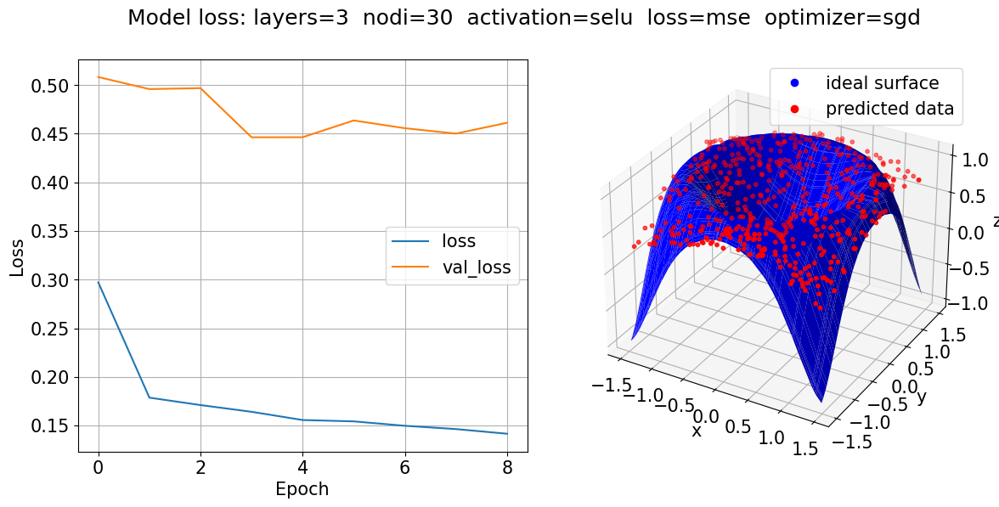

In [211]:
NN_model("selu","mse","sgd",3,30)

### VARYING N_LAYERS

Epoch 1/50
16/16 [==============================] - 0s 4ms/step - loss: 0.3113 - mse: 0.3113 - val_loss: 0.4481 - val_mse: 0.4481
Epoch 2/50
16/16 [==============================] - 0s 1ms/step - loss: 0.1848 - mse: 0.1848 - val_loss: 0.4324 - val_mse: 0.4324
Epoch 3/50
16/16 [==============================] - 0s 1ms/step - loss: 0.1827 - mse: 0.1827 - val_loss: 0.4351 - val_mse: 0.4351
Epoch 4/50
16/16 [==============================] - 0s 1ms/step - loss: 0.1788 - mse: 0.1788 - val_loss: 0.4764 - val_mse: 0.4764
Epoch 5/50
16/16 [==============================] - 0s 1ms/step - loss: 0.1780 - mse: 0.1780 - val_loss: 0.4348 - val_mse: 0.4348
Epoch 6/50
16/16 [==============================] - 0s 1ms/step - loss: 0.1791 - mse: 0.1791 - val_loss: 0.4421 - val_mse: 0.4421
Epoch 7/50
16/16 [==============================] - 0s 354us/step


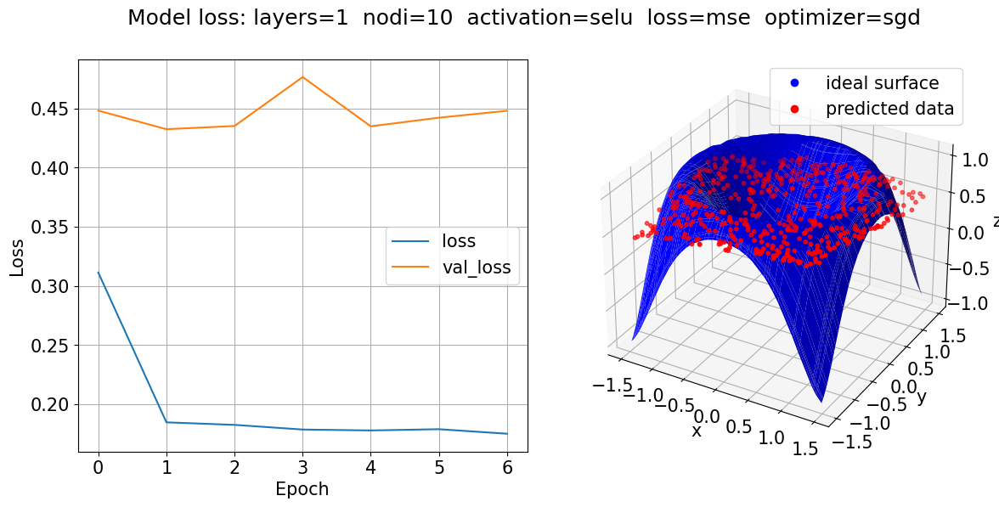

Epoch 1/50
16/16 [==============================] - 0s 4ms/step - loss: 0.4692 - mse: 0.4692 - val_loss: 0.3815 - val_mse: 0.3815
Epoch 2/50
16/16 [==============================] - 0s 1ms/step - loss: 0.2210 - mse: 0.2210 - val_loss: 0.4430 - val_mse: 0.4430
Epoch 3/50
16/16 [==============================] - 0s 1ms/step - loss: 0.2106 - mse: 0.2106 - val_loss: 0.4607 - val_mse: 0.4607
Epoch 4/50
16/16 [==============================] - 0s 1ms/step - loss: 0.2078 - mse: 0.2078 - val_loss: 0.4589 - val_mse: 0.4589
Epoch 5/50
16/16 [==============================] - 0s 1ms/step - loss: 0.2036 - mse: 0.2036 - val_loss: 0.4721 - val_mse: 0.4721
Epoch 6/50
16/16 [==============================] - 0s 360us/step


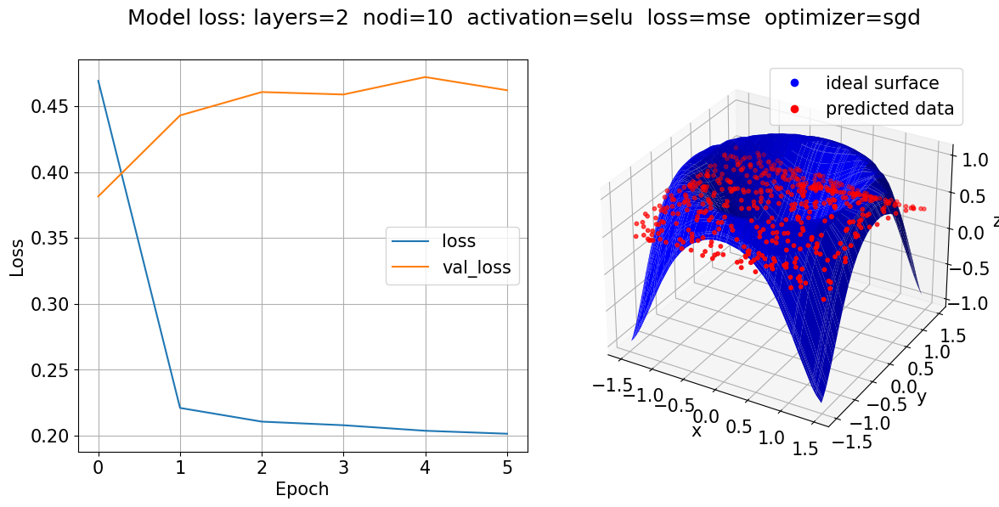

Epoch 1/50
16/16 [==============================] - 0s 4ms/step - loss: 0.9041 - mse: 0.9041 - val_loss: 0.7641 - val_mse: 0.7641
Epoch 2/50
16/16 [==============================] - 0s 1ms/step - loss: 0.2522 - mse: 0.2522 - val_loss: 0.8171 - val_mse: 0.8171
Epoch 3/50
16/16 [==============================] - 0s 1ms/step - loss: 0.2411 - mse: 0.2411 - val_loss: 0.7848 - val_mse: 0.7848
Epoch 4/50
16/16 [==============================] - 0s 1ms/step - loss: 0.2318 - mse: 0.2318 - val_loss: 0.6770 - val_mse: 0.6770
Epoch 5/50
16/16 [==============================] - 0s 1ms/step - loss: 0.2267 - mse: 0.2267 - val_loss: 0.6961 - val_mse: 0.6961
Epoch 6/50
16/16 [==============================] - 0s 1ms/step - loss: 0.2209 - mse: 0.2209 - val_loss: 0.6599 - val_mse: 0.6599
Epoch 7/50
16/16 [==============================] - 0s 1ms/step - loss: 0.2169 - mse: 0.2169 - val_loss: 0.7506 - val_mse: 0.7506
Epoch 8/50
16/16 [==============================] - 0s 1ms/step - loss: 0.2160 - mse: 0.21

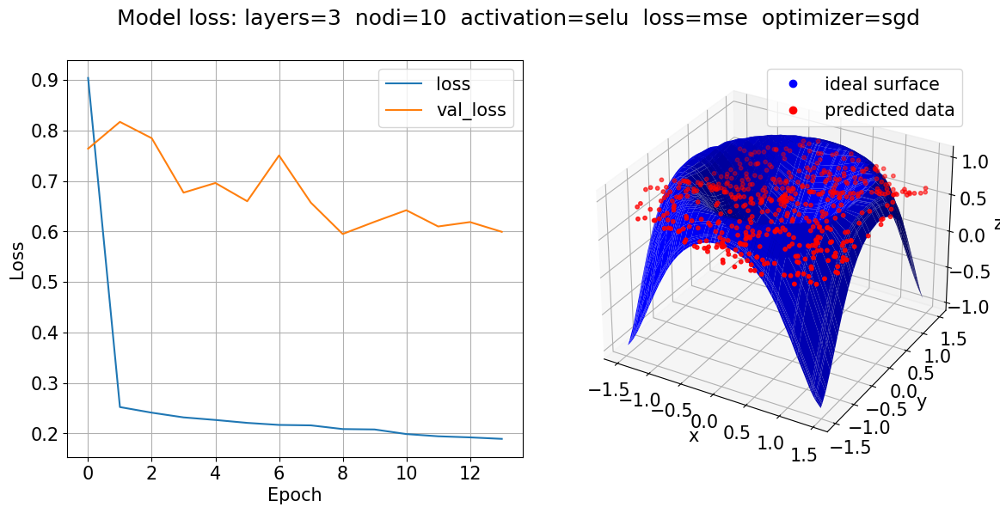

Epoch 1/50
16/16 [==============================] - 0s 4ms/step - loss: 0.4297 - mse: 0.4297 - val_loss: 0.7387 - val_mse: 0.7387
Epoch 2/50
16/16 [==============================] - 0s 1ms/step - loss: 0.2390 - mse: 0.2390 - val_loss: 0.6277 - val_mse: 0.6277
Epoch 3/50
16/16 [==============================] - 0s 1ms/step - loss: 0.2218 - mse: 0.2218 - val_loss: 0.5764 - val_mse: 0.5764
Epoch 4/50
16/16 [==============================] - 0s 1ms/step - loss: 0.2170 - mse: 0.2170 - val_loss: 0.6416 - val_mse: 0.6416
Epoch 5/50
16/16 [==============================] - 0s 5ms/step - loss: 0.1997 - mse: 0.1997 - val_loss: 0.5622 - val_mse: 0.5622
Epoch 6/50
16/16 [==============================] - 0s 2ms/step - loss: 0.1950 - mse: 0.1950 - val_loss: 0.6457 - val_mse: 0.6457
Epoch 7/50
16/16 [==============================] - 0s 1ms/step - loss: 0.1859 - mse: 0.1859 - val_loss: 0.5291 - val_mse: 0.5291
Epoch 8/50
16/16 [==============================] - 0s 1ms/step - loss: 0.1840 - mse: 0.18

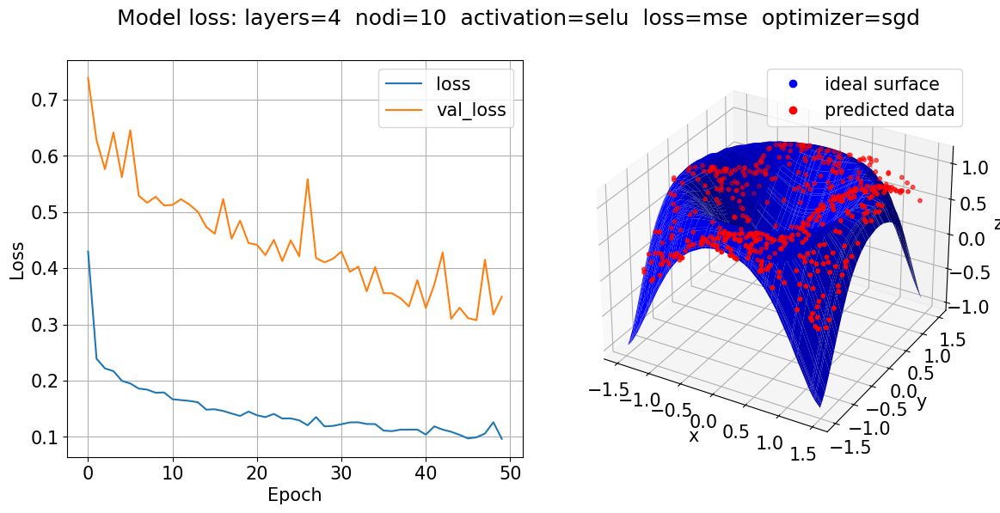

Epoch 1/50
16/16 [==============================] - 0s 4ms/step - loss: 0.3131 - mse: 0.3131 - val_loss: 0.7092 - val_mse: 0.7092
Epoch 2/50
16/16 [==============================] - 0s 1ms/step - loss: 0.2128 - mse: 0.2128 - val_loss: 0.6572 - val_mse: 0.6572
Epoch 3/50
16/16 [==============================] - 0s 1ms/step - loss: 0.1997 - mse: 0.1997 - val_loss: 0.7027 - val_mse: 0.7027
Epoch 4/50
16/16 [==============================] - 0s 1ms/step - loss: 0.1869 - mse: 0.1869 - val_loss: 0.6176 - val_mse: 0.6176
Epoch 5/50
16/16 [==============================] - 0s 1ms/step - loss: 0.1836 - mse: 0.1836 - val_loss: 0.6543 - val_mse: 0.6543
Epoch 6/50
16/16 [==============================] - 0s 1ms/step - loss: 0.1803 - mse: 0.1803 - val_loss: 0.5595 - val_mse: 0.5595
Epoch 7/50
16/16 [==============================] - 0s 1ms/step - loss: 0.1728 - mse: 0.1728 - val_loss: 0.5882 - val_mse: 0.5882
Epoch 8/50
16/16 [==============================] - 0s 1ms/step - loss: 0.1672 - mse: 0.16

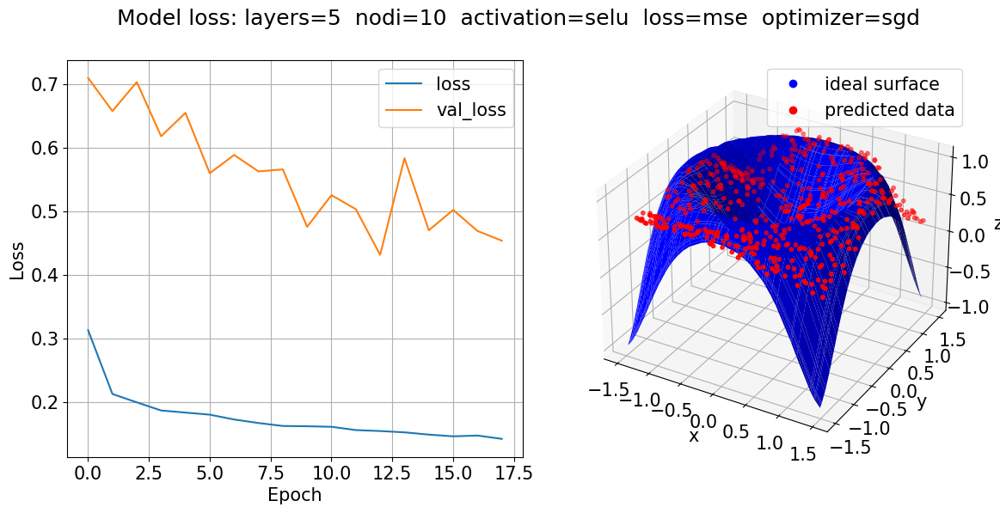

Epoch 1/50
16/16 [==============================] - 0s 5ms/step - loss: 0.3098 - mse: 0.3098 - val_loss: 0.4508 - val_mse: 0.4508
Epoch 2/50
16/16 [==============================] - 0s 1ms/step - loss: 0.1932 - mse: 0.1932 - val_loss: 0.4891 - val_mse: 0.4891
Epoch 3/50
16/16 [==============================] - 0s 1ms/step - loss: 0.1802 - mse: 0.1802 - val_loss: 0.4806 - val_mse: 0.4806
Epoch 4/50
16/16 [==============================] - 0s 1ms/step - loss: 0.1776 - mse: 0.1776 - val_loss: 0.4955 - val_mse: 0.4955
Epoch 5/50
16/16 [==============================] - 0s 1ms/step - loss: 0.1977 - mse: 0.1977 - val_loss: 0.5081 - val_mse: 0.5081
Epoch 6/50
16/16 [==============================] - 0s 1ms/step - loss: 0.1801 - mse: 0.1801 - val_loss: 0.4486 - val_mse: 0.4486
Epoch 7/50
16/16 [==============================] - 0s 1ms/step - loss: 0.1698 - mse: 0.1698 - val_loss: 0.4675 - val_mse: 0.4675
Epoch 8/50
16/16 [==============================] - 0s 1ms/step - loss: 0.1720 - mse: 0.17

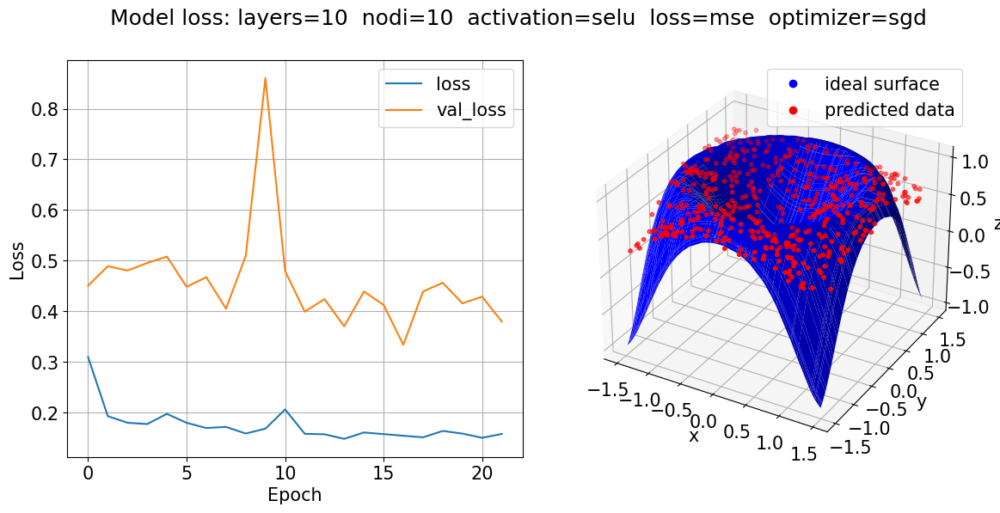

Epoch 1/50
16/16 [==============================] - 0s 6ms/step - loss: 0.8257 - mse: 0.8257 - val_loss: 0.5076 - val_mse: 0.5076
Epoch 2/50
16/16 [==============================] - 0s 1ms/step - loss: 0.1971 - mse: 0.1971 - val_loss: 0.5400 - val_mse: 0.5400
Epoch 3/50
16/16 [==============================] - 0s 1ms/step - loss: 0.1870 - mse: 0.1870 - val_loss: 0.5195 - val_mse: 0.5195
Epoch 4/50
16/16 [==============================] - 0s 1ms/step - loss: 0.1930 - mse: 0.1930 - val_loss: 0.4575 - val_mse: 0.4575
Epoch 5/50
16/16 [==============================] - 0s 1ms/step - loss: 0.1897 - mse: 0.1897 - val_loss: 0.7025 - val_mse: 0.7025
Epoch 6/50
16/16 [==============================] - 0s 1ms/step - loss: 0.1986 - mse: 0.1986 - val_loss: 0.5669 - val_mse: 0.5669
Epoch 7/50
16/16 [==============================] - 0s 1ms/step - loss: 0.1812 - mse: 0.1812 - val_loss: 0.4941 - val_mse: 0.4941
Epoch 8/50
16/16 [==============================] - 0s 1ms/step - loss: 0.1808 - mse: 0.18

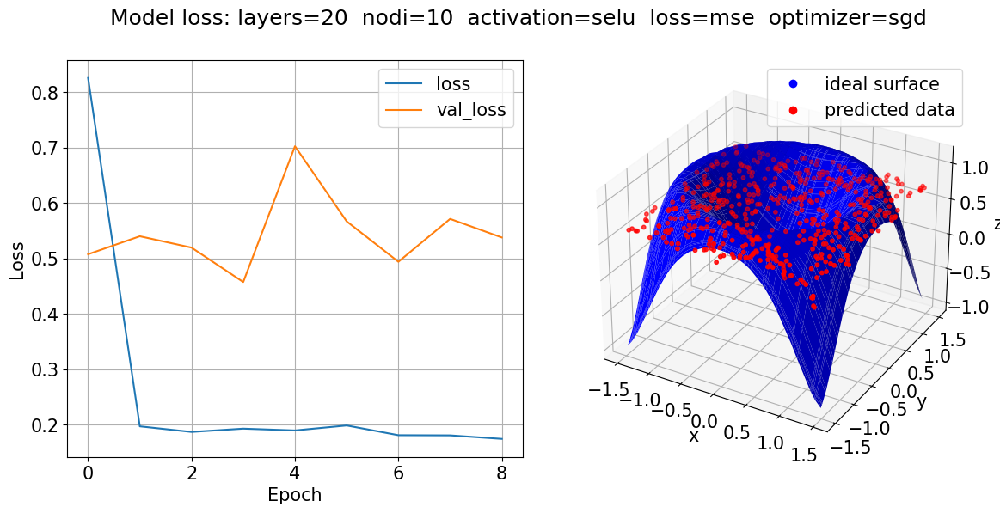

In [212]:
layers = [1,2,3,4,5,10,20]
for n_layers in layers:
    NN_model("selu","mse","sgd",n_layers,10)

### VARYING NODES

Epoch 1/50
16/16 [==============================] - 0s 4ms/step - loss: 0.3572 - mse: 0.3572 - val_loss: 0.6533 - val_mse: 0.6533
Epoch 2/50
16/16 [==============================] - 0s 1ms/step - loss: 0.2149 - mse: 0.2149 - val_loss: 0.6760 - val_mse: 0.6760
Epoch 3/50
16/16 [==============================] - 0s 1ms/step - loss: 0.2100 - mse: 0.2100 - val_loss: 0.6626 - val_mse: 0.6626
Epoch 4/50
16/16 [==============================] - 0s 1ms/step - loss: 0.2079 - mse: 0.2079 - val_loss: 0.6559 - val_mse: 0.6559
Epoch 5/50
16/16 [==============================] - 0s 1ms/step - loss: 0.2035 - mse: 0.2035 - val_loss: 0.6581 - val_mse: 0.6581
Epoch 6/50
16/16 [==============================] - 0s 365us/step


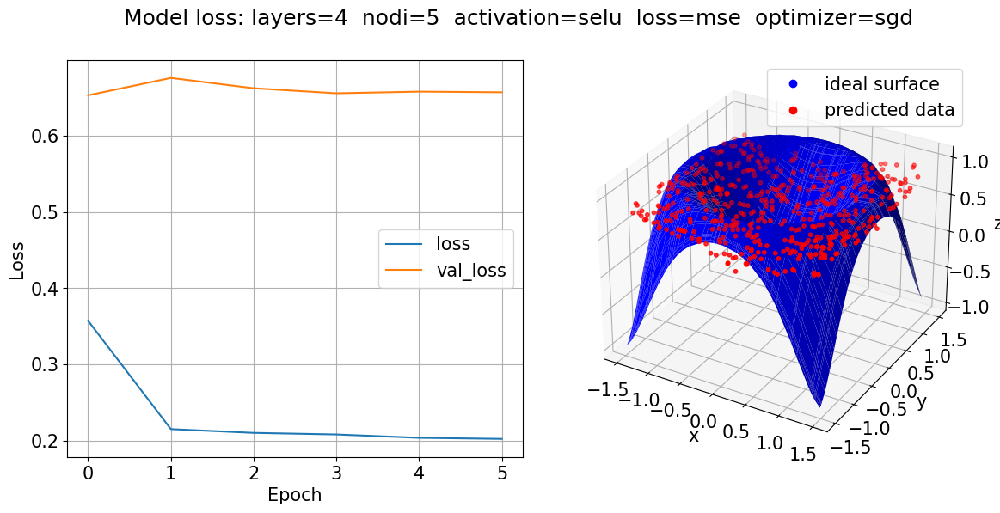

Epoch 1/50
16/16 [==============================] - 1s 4ms/step - loss: 0.5255 - mse: 0.5255 - val_loss: 0.7954 - val_mse: 0.7954
Epoch 2/50
16/16 [==============================] - 0s 1ms/step - loss: 0.2161 - mse: 0.2161 - val_loss: 0.6378 - val_mse: 0.6378
Epoch 3/50
16/16 [==============================] - 0s 1ms/step - loss: 0.2203 - mse: 0.2203 - val_loss: 0.6785 - val_mse: 0.6785
Epoch 4/50
16/16 [==============================] - 0s 2ms/step - loss: 0.2103 - mse: 0.2103 - val_loss: 0.6152 - val_mse: 0.6152
Epoch 5/50
16/16 [==============================] - 0s 1ms/step - loss: 0.1991 - mse: 0.1991 - val_loss: 0.6518 - val_mse: 0.6518
Epoch 6/50
16/16 [==============================] - 0s 1ms/step - loss: 0.1909 - mse: 0.1909 - val_loss: 0.6496 - val_mse: 0.6496
Epoch 7/50
16/16 [==============================] - 0s 1ms/step - loss: 0.1927 - mse: 0.1927 - val_loss: 0.6250 - val_mse: 0.6250
Epoch 8/50
16/16 [==============================] - 0s 1ms/step - loss: 0.1874 - mse: 0.18

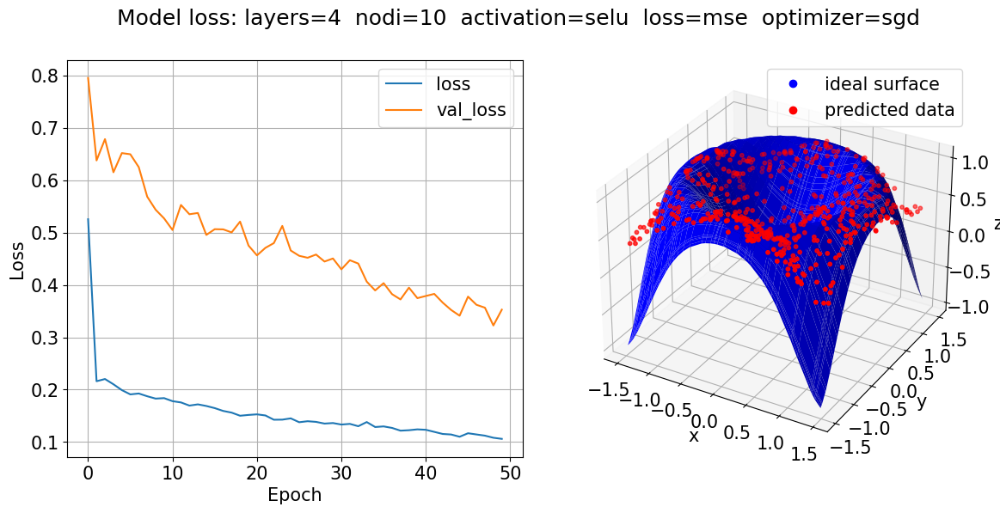

Epoch 1/50
16/16 [==============================] - 0s 4ms/step - loss: 0.3640 - mse: 0.3640 - val_loss: 0.6687 - val_mse: 0.6687
Epoch 2/50
16/16 [==============================] - 0s 1ms/step - loss: 0.2308 - mse: 0.2308 - val_loss: 0.5646 - val_mse: 0.5646
Epoch 3/50
16/16 [==============================] - 0s 1ms/step - loss: 0.2192 - mse: 0.2192 - val_loss: 0.5071 - val_mse: 0.5071
Epoch 4/50
16/16 [==============================] - 0s 1ms/step - loss: 0.2050 - mse: 0.2050 - val_loss: 0.4399 - val_mse: 0.4399
Epoch 5/50
16/16 [==============================] - 0s 1ms/step - loss: 0.1908 - mse: 0.1908 - val_loss: 0.4630 - val_mse: 0.4630
Epoch 6/50
16/16 [==============================] - 0s 1ms/step - loss: 0.1933 - mse: 0.1933 - val_loss: 0.5261 - val_mse: 0.5261
Epoch 7/50
16/16 [==============================] - 0s 1ms/step - loss: 0.1778 - mse: 0.1778 - val_loss: 0.4274 - val_mse: 0.4274
Epoch 8/50
16/16 [==============================] - 0s 1ms/step - loss: 0.1776 - mse: 0.17

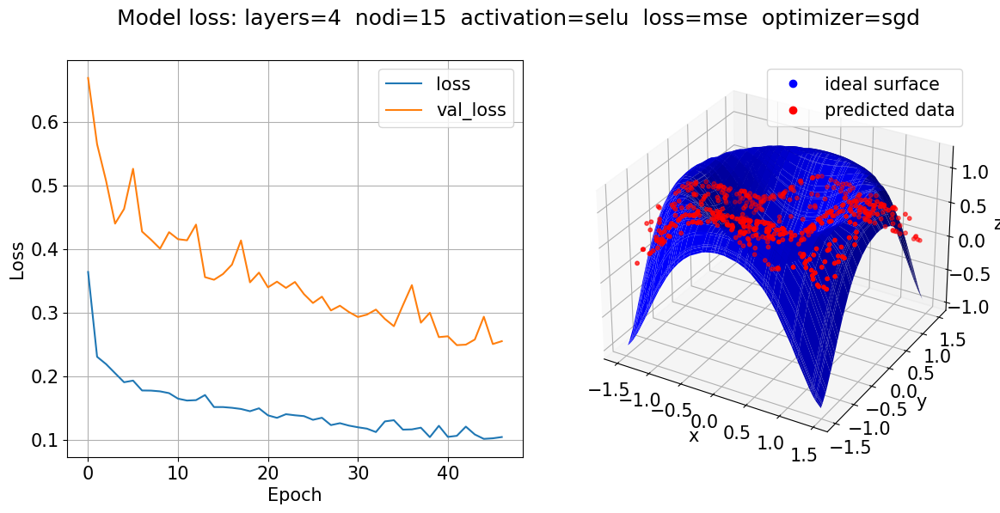

Epoch 1/50
16/16 [==============================] - 0s 4ms/step - loss: 0.5739 - mse: 0.5739 - val_loss: 0.5865 - val_mse: 0.5865
Epoch 2/50
16/16 [==============================] - 0s 1ms/step - loss: 0.2388 - mse: 0.2388 - val_loss: 0.5290 - val_mse: 0.5290
Epoch 3/50
16/16 [==============================] - 0s 1ms/step - loss: 0.2161 - mse: 0.2161 - val_loss: 0.4992 - val_mse: 0.4992
Epoch 4/50
16/16 [==============================] - 0s 1ms/step - loss: 0.2034 - mse: 0.2034 - val_loss: 0.5188 - val_mse: 0.5188
Epoch 5/50
16/16 [==============================] - 0s 1ms/step - loss: 0.1831 - mse: 0.1831 - val_loss: 0.4695 - val_mse: 0.4695
Epoch 6/50
16/16 [==============================] - 0s 1ms/step - loss: 0.1601 - mse: 0.1601 - val_loss: 0.4087 - val_mse: 0.4087
Epoch 7/50
16/16 [==============================] - 0s 1ms/step - loss: 0.1572 - mse: 0.1572 - val_loss: 0.4232 - val_mse: 0.4232
Epoch 8/50
16/16 [==============================] - 0s 1ms/step - loss: 0.1616 - mse: 0.16

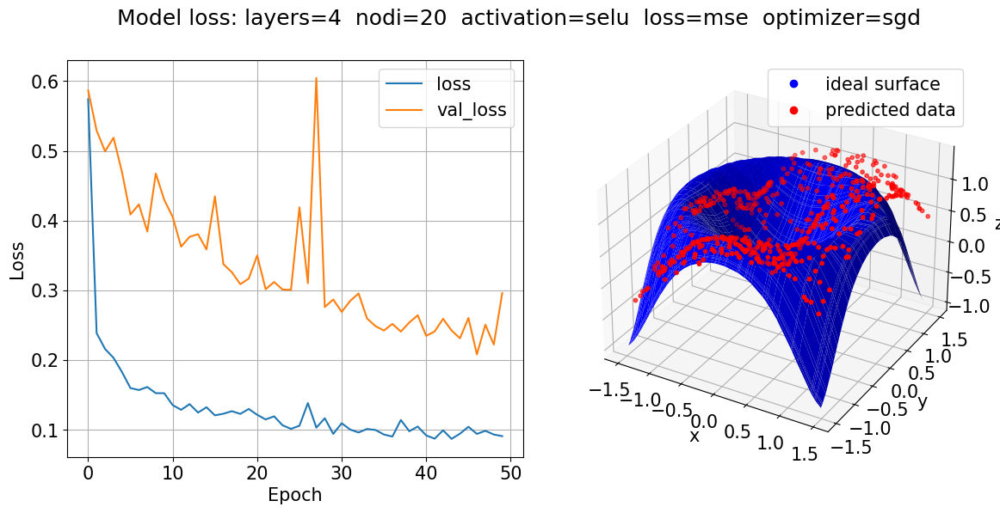

Epoch 1/50
16/16 [==============================] - 0s 4ms/step - loss: 0.2673 - mse: 0.2673 - val_loss: 0.4832 - val_mse: 0.4832
Epoch 2/50
16/16 [==============================] - 0s 1ms/step - loss: 0.1837 - mse: 0.1837 - val_loss: 0.5033 - val_mse: 0.5033
Epoch 3/50
16/16 [==============================] - 0s 1ms/step - loss: 0.1627 - mse: 0.1627 - val_loss: 0.4304 - val_mse: 0.4304
Epoch 4/50
16/16 [==============================] - 0s 1ms/step - loss: 0.1646 - mse: 0.1646 - val_loss: 0.4871 - val_mse: 0.4871
Epoch 5/50
16/16 [==============================] - 0s 1ms/step - loss: 0.1583 - mse: 0.1583 - val_loss: 0.4716 - val_mse: 0.4716
Epoch 6/50
16/16 [==============================] - 0s 1ms/step - loss: 0.1497 - mse: 0.1497 - val_loss: 0.4216 - val_mse: 0.4216
Epoch 7/50
16/16 [==============================] - 0s 1ms/step - loss: 0.1546 - mse: 0.1546 - val_loss: 0.4395 - val_mse: 0.4395
Epoch 8/50
16/16 [==============================] - 0s 1ms/step - loss: 0.1550 - mse: 0.15

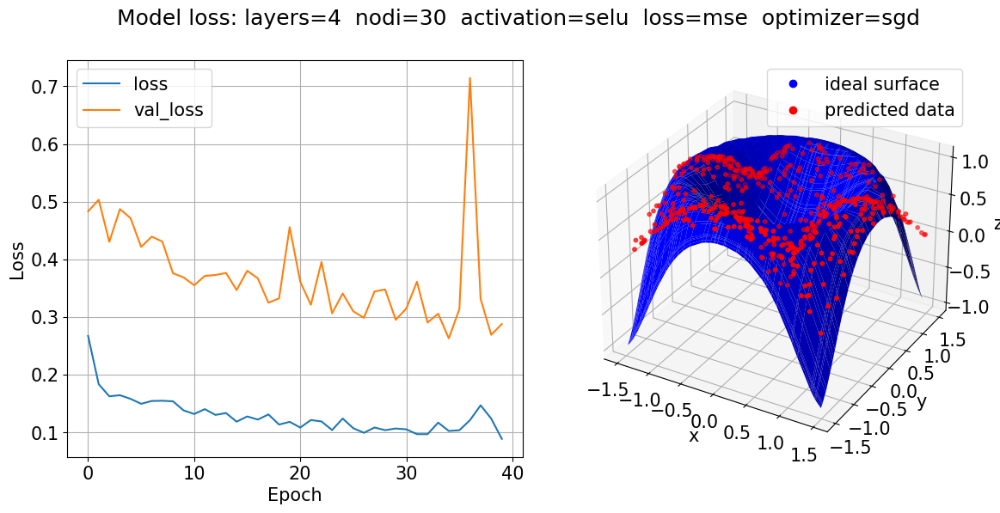

Epoch 1/50
16/16 [==============================] - 0s 4ms/step - loss: 0.2891 - mse: 0.2891 - val_loss: 0.9136 - val_mse: 0.9136
Epoch 2/50
16/16 [==============================] - 0s 1ms/step - loss: 0.2706 - mse: 0.2706 - val_loss: 0.4685 - val_mse: 0.4685
Epoch 3/50
16/16 [==============================] - 0s 1ms/step - loss: 0.1814 - mse: 0.1814 - val_loss: 0.5098 - val_mse: 0.5098
Epoch 4/50
16/16 [==============================] - 0s 1ms/step - loss: 0.1832 - mse: 0.1832 - val_loss: 0.4771 - val_mse: 0.4771
Epoch 5/50
16/16 [==============================] - 0s 1ms/step - loss: 0.1611 - mse: 0.1611 - val_loss: 0.4839 - val_mse: 0.4839
Epoch 6/50
16/16 [==============================] - 0s 1ms/step - loss: 0.1503 - mse: 0.1503 - val_loss: 0.4484 - val_mse: 0.4484
Epoch 7/50
16/16 [==============================] - 0s 1ms/step - loss: 0.1530 - mse: 0.1530 - val_loss: 0.4828 - val_mse: 0.4828
Epoch 8/50
16/16 [==============================] - 0s 1ms/step - loss: 0.1376 - mse: 0.13

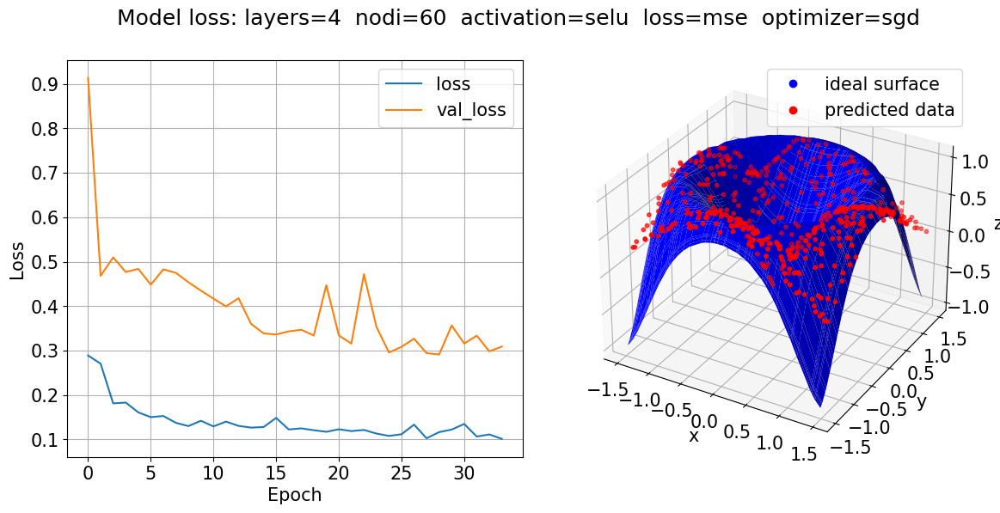

In [213]:
nodes = [5,10,15,20,30,60]
for n_nodes in nodes:
    NN_model("selu","mse","sgd",4,n_nodes)

### VARYING OPTIMIZER

Epoch 1/50
16/16 [==============================] - 0s 4ms/step - loss: 0.4513 - mse: 0.4513 - val_loss: 0.5416 - val_mse: 0.5416
Epoch 2/50
16/16 [==============================] - 0s 1ms/step - loss: 0.2227 - mse: 0.2227 - val_loss: 0.4993 - val_mse: 0.4993
Epoch 3/50
16/16 [==============================] - 0s 1ms/step - loss: 0.2005 - mse: 0.2005 - val_loss: 0.4661 - val_mse: 0.4661
Epoch 4/50
16/16 [==============================] - 0s 1ms/step - loss: 0.1893 - mse: 0.1893 - val_loss: 0.5105 - val_mse: 0.5105
Epoch 5/50
16/16 [==============================] - 0s 1ms/step - loss: 0.1859 - mse: 0.1859 - val_loss: 0.4773 - val_mse: 0.4773
Epoch 6/50
16/16 [==============================] - 0s 1ms/step - loss: 0.1742 - mse: 0.1742 - val_loss: 0.4565 - val_mse: 0.4565
Epoch 7/50
16/16 [==============================] - 0s 1ms/step - loss: 0.1752 - mse: 0.1752 - val_loss: 0.4673 - val_mse: 0.4673
Epoch 8/50
16/16 [==============================] - 0s 1ms/step - loss: 0.1655 - mse: 0.16

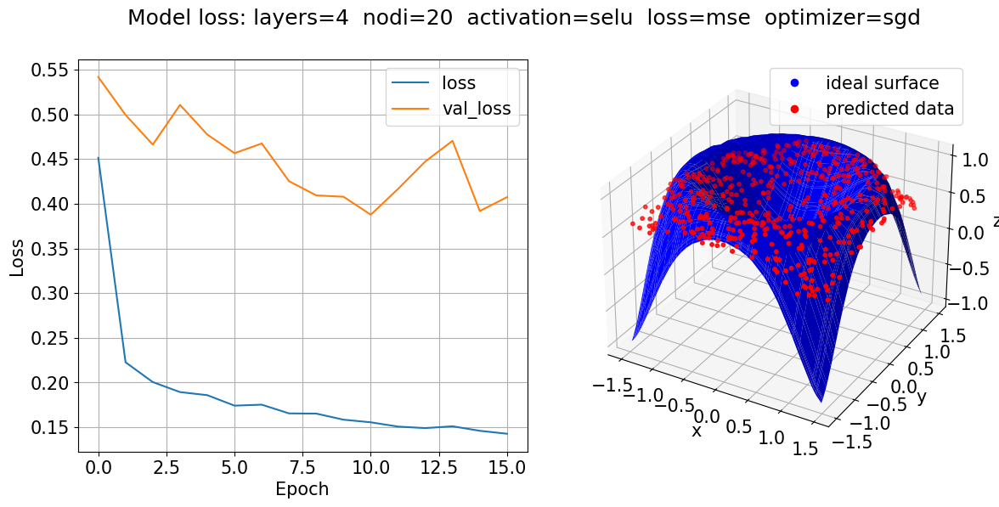

Epoch 1/50
16/16 [==============================] - 0s 4ms/step - loss: 0.1826 - mse: 0.1826 - val_loss: 0.3962 - val_mse: 0.3962
Epoch 2/50
16/16 [==============================] - 0s 1ms/step - loss: 0.1572 - mse: 0.1572 - val_loss: 0.3697 - val_mse: 0.3697
Epoch 3/50
16/16 [==============================] - 0s 1ms/step - loss: 0.1476 - mse: 0.1476 - val_loss: 0.3725 - val_mse: 0.3725
Epoch 4/50
16/16 [==============================] - 0s 1ms/step - loss: 0.1337 - mse: 0.1337 - val_loss: 0.3682 - val_mse: 0.3682
Epoch 5/50
16/16 [==============================] - 0s 1ms/step - loss: 0.1352 - mse: 0.1352 - val_loss: 0.3373 - val_mse: 0.3373
Epoch 6/50
16/16 [==============================] - 0s 1ms/step - loss: 0.1239 - mse: 0.1239 - val_loss: 0.3230 - val_mse: 0.3230
Epoch 7/50
16/16 [==============================] - 0s 1ms/step - loss: 0.1172 - mse: 0.1172 - val_loss: 0.3202 - val_mse: 0.3202
Epoch 8/50
16/16 [==============================] - 0s 1ms/step - loss: 0.1086 - mse: 0.10

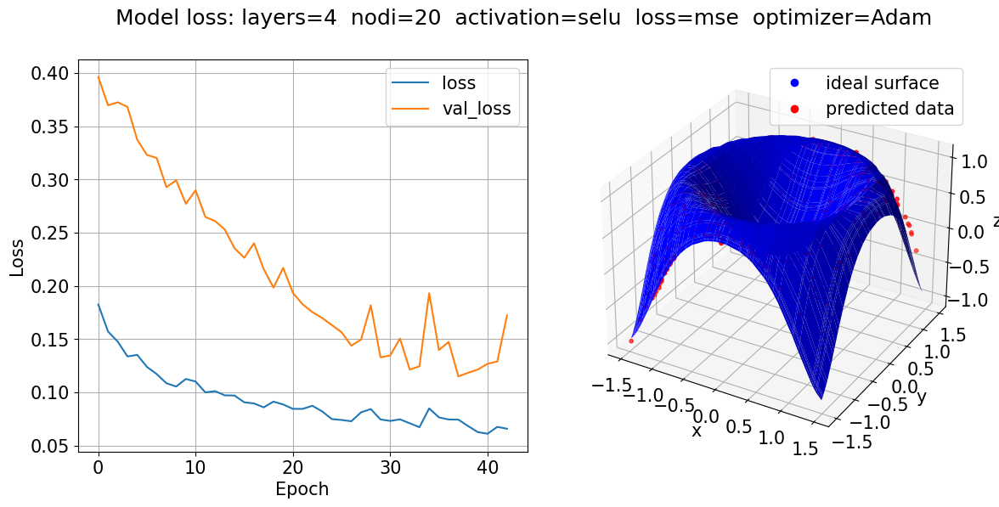

Epoch 1/50
16/16 [==============================] - 0s 4ms/step - loss: 0.6185 - mse: 0.6185 - val_loss: 0.4849 - val_mse: 0.4849
Epoch 2/50
16/16 [==============================] - 0s 1ms/step - loss: 0.1832 - mse: 0.1832 - val_loss: 0.4514 - val_mse: 0.4514
Epoch 3/50
16/16 [==============================] - 0s 1ms/step - loss: 0.1672 - mse: 0.1672 - val_loss: 0.4173 - val_mse: 0.4173
Epoch 4/50
16/16 [==============================] - 0s 1ms/step - loss: 0.1589 - mse: 0.1589 - val_loss: 0.3808 - val_mse: 0.3808
Epoch 5/50
16/16 [==============================] - 0s 1ms/step - loss: 0.1497 - mse: 0.1497 - val_loss: 0.3593 - val_mse: 0.3593
Epoch 6/50
16/16 [==============================] - 0s 1ms/step - loss: 0.1428 - mse: 0.1428 - val_loss: 0.3496 - val_mse: 0.3496
Epoch 7/50
16/16 [==============================] - 0s 1ms/step - loss: 0.1380 - mse: 0.1380 - val_loss: 0.3653 - val_mse: 0.3653
Epoch 8/50
16/16 [==============================] - 0s 1ms/step - loss: 0.1356 - mse: 0.13

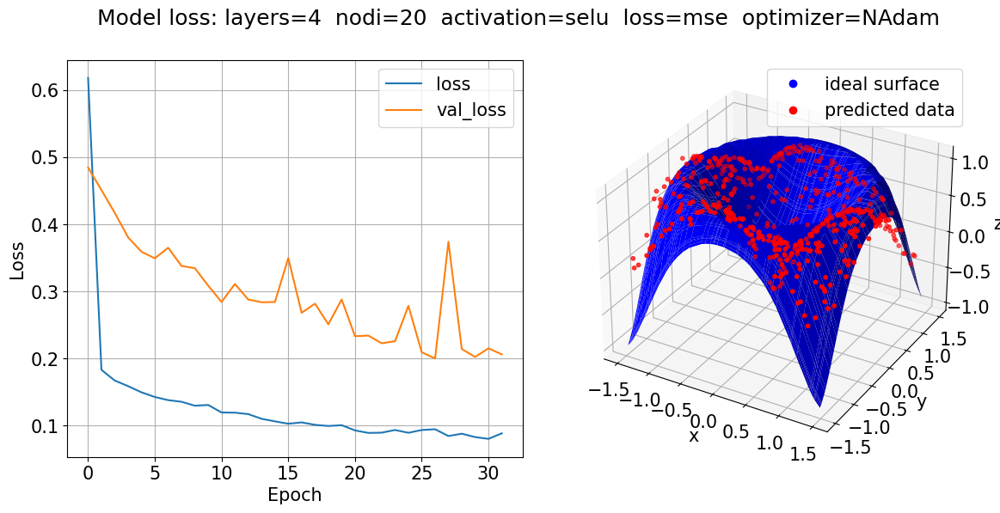

Epoch 1/50
16/16 [==============================] - 0s 4ms/step - loss: 0.2588 - mse: 0.2588 - val_loss: 0.5679 - val_mse: 0.5679
Epoch 2/50
16/16 [==============================] - 0s 1ms/step - loss: 0.1870 - mse: 0.1870 - val_loss: 0.5136 - val_mse: 0.5136
Epoch 3/50
16/16 [==============================] - 0s 1ms/step - loss: 0.1893 - mse: 0.1893 - val_loss: 0.5201 - val_mse: 0.5201
Epoch 4/50
16/16 [==============================] - 0s 1ms/step - loss: 0.1704 - mse: 0.1704 - val_loss: 0.4495 - val_mse: 0.4495
Epoch 5/50
16/16 [==============================] - 0s 1ms/step - loss: 0.1679 - mse: 0.1679 - val_loss: 0.4816 - val_mse: 0.4816
Epoch 6/50
16/16 [==============================] - 0s 1ms/step - loss: 0.1614 - mse: 0.1614 - val_loss: 0.4510 - val_mse: 0.4510
Epoch 7/50
16/16 [==============================] - 0s 1ms/step - loss: 0.1537 - mse: 0.1537 - val_loss: 0.4637 - val_mse: 0.4637
Epoch 8/50
16/16 [==============================] - 0s 1ms/step - loss: 0.1526 - mse: 0.15

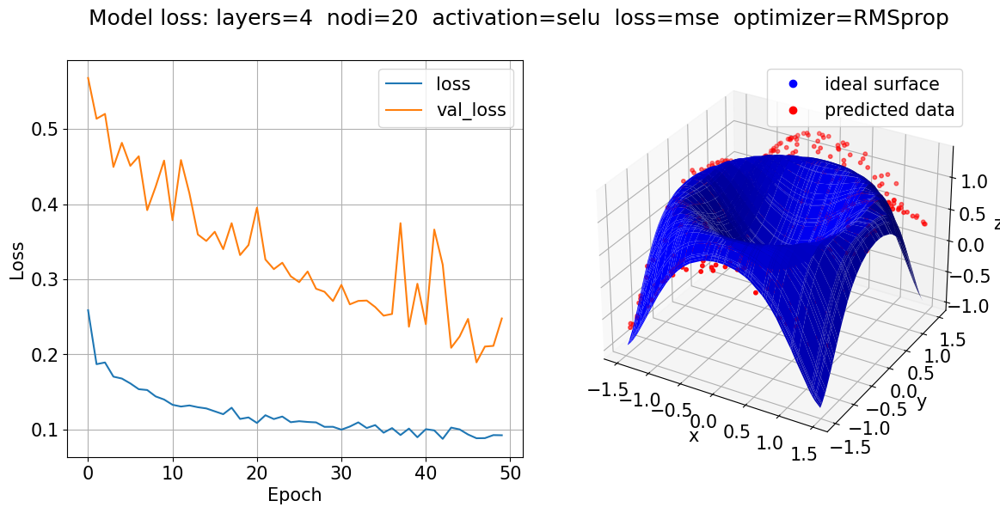

Epoch 1/50
16/16 [==============================] - 0s 4ms/step - loss: 0.8745 - mse: 0.8745 - val_loss: 0.5013 - val_mse: 0.5013
Epoch 2/50
16/16 [==============================] - 0s 1ms/step - loss: 0.3950 - mse: 0.3950 - val_loss: 0.5322 - val_mse: 0.5322
Epoch 3/50
16/16 [==============================] - 0s 1ms/step - loss: 0.2958 - mse: 0.2958 - val_loss: 0.5597 - val_mse: 0.5597
Epoch 4/50
16/16 [==============================] - 0s 1ms/step - loss: 0.2532 - mse: 0.2532 - val_loss: 0.5862 - val_mse: 0.5862
Epoch 5/50
16/16 [==============================] - 0s 1ms/step - loss: 0.2311 - mse: 0.2311 - val_loss: 0.6033 - val_mse: 0.6033
Epoch 6/50
16/16 [==============================] - 0s 397us/step


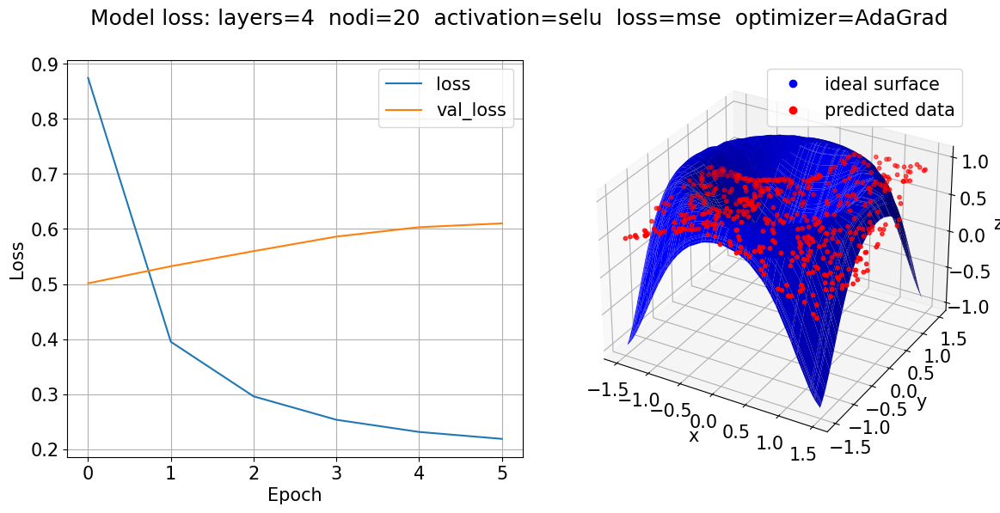

Epoch 1/50
16/16 [==============================] - 0s 4ms/step - loss: 0.9005 - mse: 0.9005 - val_loss: 0.5569 - val_mse: 0.5569
Epoch 2/50
16/16 [==============================] - 0s 1ms/step - loss: 0.2248 - mse: 0.2248 - val_loss: 0.5323 - val_mse: 0.5323
Epoch 3/50
16/16 [==============================] - 0s 1ms/step - loss: 0.1667 - mse: 0.1667 - val_loss: 0.4786 - val_mse: 0.4786
Epoch 4/50
16/16 [==============================] - 0s 1ms/step - loss: 0.1601 - mse: 0.1601 - val_loss: 0.4880 - val_mse: 0.4880
Epoch 5/50
16/16 [==============================] - 0s 1ms/step - loss: 0.1554 - mse: 0.1554 - val_loss: 0.4821 - val_mse: 0.4821
Epoch 6/50
16/16 [==============================] - 0s 1ms/step - loss: 0.1509 - mse: 0.1509 - val_loss: 0.4702 - val_mse: 0.4702
Epoch 7/50
16/16 [==============================] - 0s 1ms/step - loss: 0.1488 - mse: 0.1488 - val_loss: 0.4646 - val_mse: 0.4646
Epoch 8/50
16/16 [==============================] - 0s 1ms/step - loss: 0.1453 - mse: 0.14

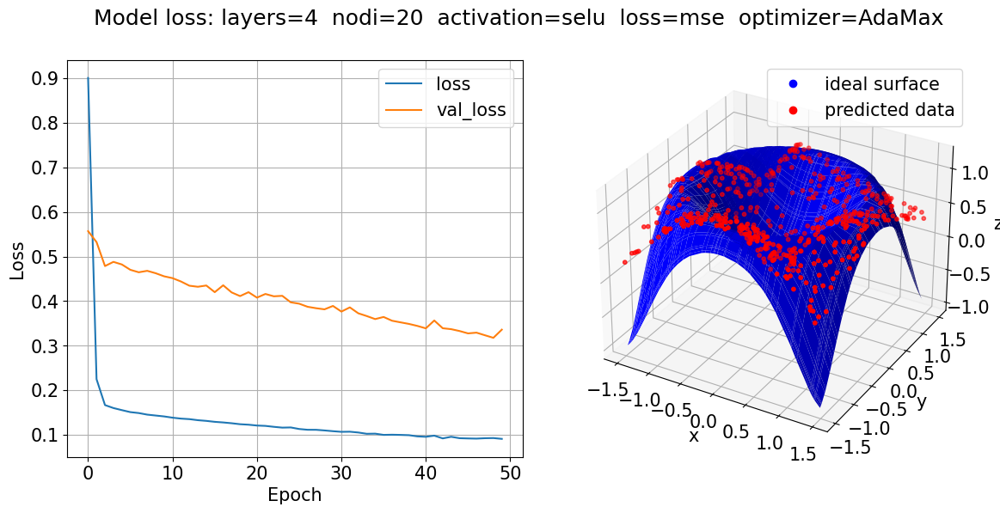

In [215]:
optimizer = ["sgd","Adam","NAdam","RMSprop","AdaGrad","AdaMax"]
for opt in optimizer:
    NN_model("selu","mse",opt,4,20)

### VARYING LOSS

Epoch 1/50
16/16 [==============================] - 0s 5ms/step - loss: 0.4579 - mse: 0.4579 - val_loss: 0.5016 - val_mse: 0.5016
Epoch 2/50
16/16 [==============================] - 0s 1ms/step - loss: 0.1781 - mse: 0.1781 - val_loss: 0.5150 - val_mse: 0.5150
Epoch 3/50
16/16 [==============================] - 0s 1ms/step - loss: 0.1688 - mse: 0.1688 - val_loss: 0.4123 - val_mse: 0.4123
Epoch 4/50
16/16 [==============================] - 0s 1ms/step - loss: 0.1641 - mse: 0.1641 - val_loss: 0.4290 - val_mse: 0.4290
Epoch 5/50
16/16 [==============================] - 0s 1ms/step - loss: 0.1392 - mse: 0.1392 - val_loss: 0.3814 - val_mse: 0.3814
Epoch 6/50
16/16 [==============================] - 0s 1ms/step - loss: 0.1378 - mse: 0.1378 - val_loss: 0.4437 - val_mse: 0.4437
Epoch 7/50
16/16 [==============================] - 0s 1ms/step - loss: 0.1464 - mse: 0.1464 - val_loss: 0.3355 - val_mse: 0.3355
Epoch 8/50
16/16 [==============================] - 0s 1ms/step - loss: 0.1417 - mse: 0.14

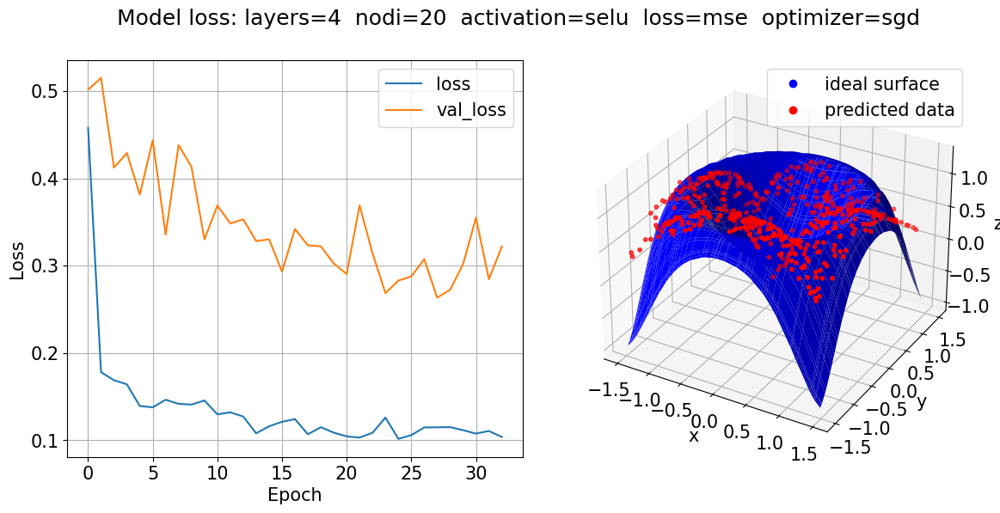

Epoch 1/50
16/16 [==============================] - 0s 4ms/step - loss: 0.5153 - mse: 0.4551 - val_loss: 0.5920 - val_mse: 0.4318
Epoch 2/50
16/16 [==============================] - 0s 1ms/step - loss: 0.4328 - mse: 0.2955 - val_loss: 0.6048 - val_mse: 0.4807
Epoch 3/50
16/16 [==============================] - 0s 1ms/step - loss: 0.3795 - mse: 0.2413 - val_loss: 0.5674 - val_mse: 0.4203
Epoch 4/50
16/16 [==============================] - 0s 1ms/step - loss: 0.3566 - mse: 0.2130 - val_loss: 0.5270 - val_mse: 0.3983
Epoch 5/50
16/16 [==============================] - 0s 1ms/step - loss: 0.3558 - mse: 0.2168 - val_loss: 0.5359 - val_mse: 0.4313
Epoch 6/50
16/16 [==============================] - 0s 1ms/step - loss: 0.3197 - mse: 0.1749 - val_loss: 0.5040 - val_mse: 0.3951
Epoch 7/50
16/16 [==============================] - 0s 1ms/step - loss: 0.3563 - mse: 0.2053 - val_loss: 0.5616 - val_mse: 0.4992
Epoch 8/50
16/16 [==============================] - 0s 1ms/step - loss: 0.3263 - mse: 0.18

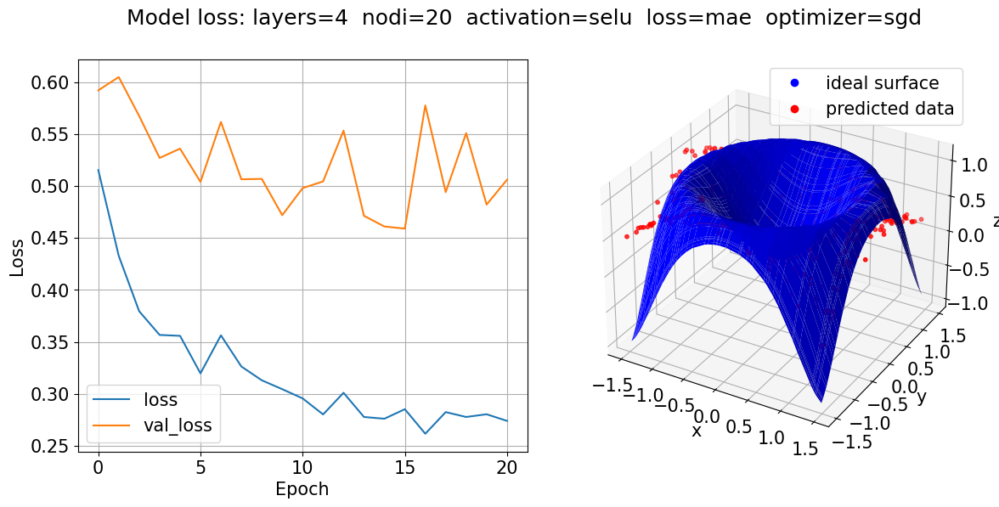

Epoch 1/50
16/16 [==============================] - 0s 4ms/step - loss: 0.3632 - mse: 0.8810 - val_loss: 0.2307 - val_mse: 0.4751
Epoch 2/50
16/16 [==============================] - 0s 1ms/step - loss: 0.0980 - mse: 0.1979 - val_loss: 0.2289 - val_mse: 0.4816
Epoch 3/50
16/16 [==============================] - 0s 1ms/step - loss: 0.0930 - mse: 0.1884 - val_loss: 0.2284 - val_mse: 0.4759
Epoch 4/50
16/16 [==============================] - 0s 1ms/step - loss: 0.0885 - mse: 0.1799 - val_loss: 0.2065 - val_mse: 0.4292
Epoch 5/50
16/16 [==============================] - 0s 1ms/step - loss: 0.0859 - mse: 0.1743 - val_loss: 0.2054 - val_mse: 0.4278
Epoch 6/50
16/16 [==============================] - 0s 1ms/step - loss: 0.0832 - mse: 0.1690 - val_loss: 0.1999 - val_mse: 0.4135
Epoch 7/50
16/16 [==============================] - 0s 1ms/step - loss: 0.0802 - mse: 0.1624 - val_loss: 0.2173 - val_mse: 0.4595
Epoch 8/50
16/16 [==============================] - 0s 1ms/step - loss: 0.0790 - mse: 0.16

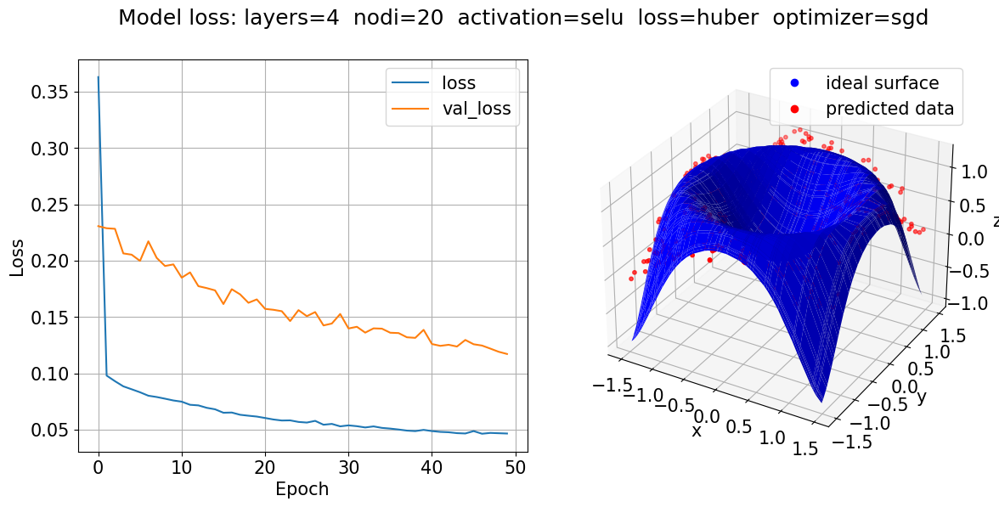

In [217]:
losses = ["mse","mae","huber"]
for loss in losses:
    NN_model("selu",loss,"sgd",4,20)

### VARYING ACT FUNCTION

Epoch 1/50
16/16 [==============================] - 0s 4ms/step - loss: 0.4162 - mse: 0.4162 - val_loss: 0.4196 - val_mse: 0.4196
Epoch 2/50
16/16 [==============================] - 0s 1ms/step - loss: 0.2462 - mse: 0.2462 - val_loss: 0.4702 - val_mse: 0.4702
Epoch 3/50
16/16 [==============================] - 0s 1ms/step - loss: 0.1976 - mse: 0.1976 - val_loss: 0.5148 - val_mse: 0.5148
Epoch 4/50
16/16 [==============================] - 0s 1ms/step - loss: 0.1863 - mse: 0.1863 - val_loss: 0.5402 - val_mse: 0.5402
Epoch 5/50
16/16 [==============================] - 0s 1ms/step - loss: 0.1830 - mse: 0.1830 - val_loss: 0.5568 - val_mse: 0.5568
Epoch 6/50
16/16 [==============================] - 0s 364us/step


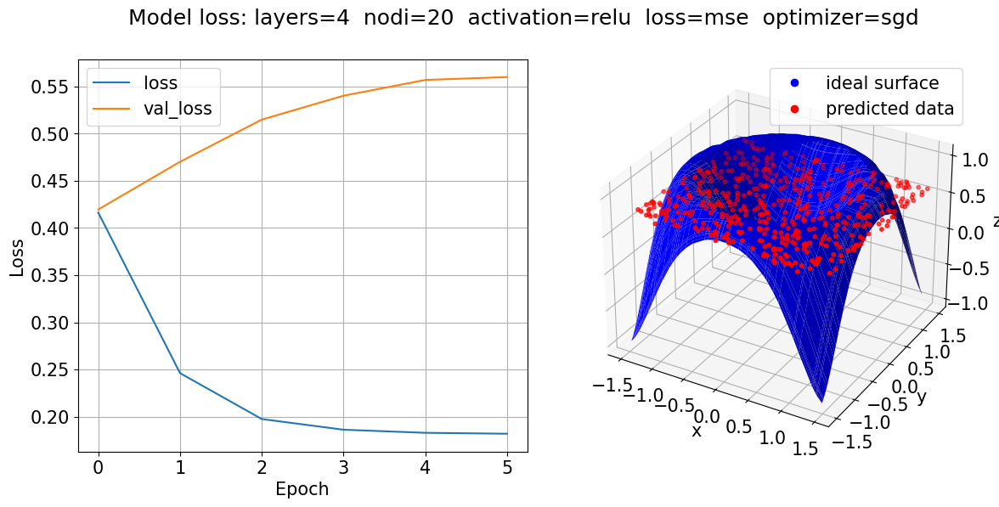

Epoch 1/50
16/16 [==============================] - 0s 4ms/step - loss: 0.3132 - mse: 0.3132 - val_loss: 0.5156 - val_mse: 0.5156
Epoch 2/50
16/16 [==============================] - 0s 1ms/step - loss: 0.1877 - mse: 0.1877 - val_loss: 0.5380 - val_mse: 0.5380
Epoch 3/50
16/16 [==============================] - 0s 1ms/step - loss: 0.1854 - mse: 0.1854 - val_loss: 0.5332 - val_mse: 0.5332
Epoch 4/50
16/16 [==============================] - 0s 1ms/step - loss: 0.1858 - mse: 0.1858 - val_loss: 0.5353 - val_mse: 0.5353
Epoch 5/50
16/16 [==============================] - 0s 1ms/step - loss: 0.1848 - mse: 0.1848 - val_loss: 0.5201 - val_mse: 0.5201
Epoch 6/50
16/16 [==============================] - 0s 380us/step


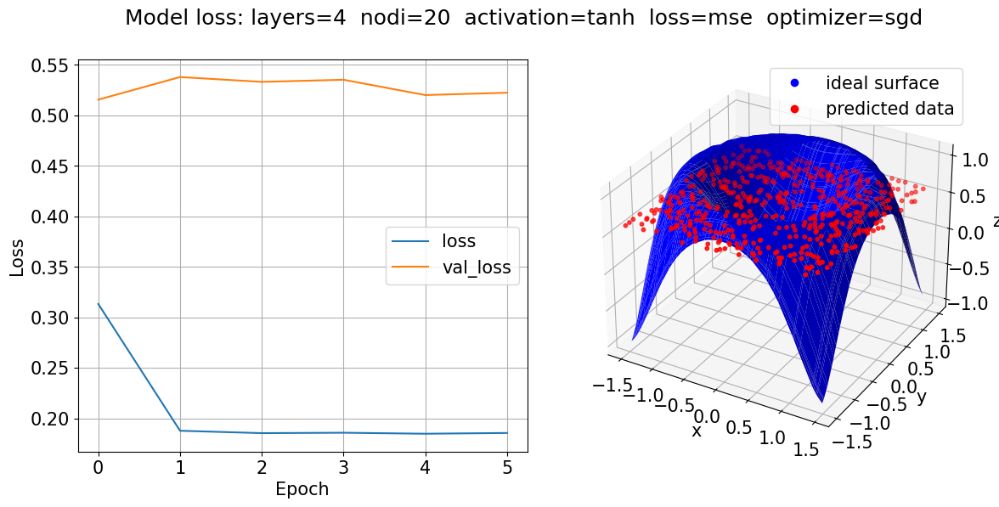

Epoch 1/50
16/16 [==============================] - 0s 4ms/step - loss: 0.1875 - mse: 0.1875 - val_loss: 0.5060 - val_mse: 0.5060
Epoch 2/50
16/16 [==============================] - 0s 1ms/step - loss: 0.1869 - mse: 0.1869 - val_loss: 0.5094 - val_mse: 0.5094
Epoch 3/50
16/16 [==============================] - 0s 1ms/step - loss: 0.1865 - mse: 0.1865 - val_loss: 0.5128 - val_mse: 0.5128
Epoch 4/50
16/16 [==============================] - 0s 1ms/step - loss: 0.1862 - mse: 0.1862 - val_loss: 0.5156 - val_mse: 0.5156
Epoch 5/50
16/16 [==============================] - 0s 1ms/step - loss: 0.1860 - mse: 0.1860 - val_loss: 0.5179 - val_mse: 0.5179
Epoch 6/50
16/16 [==============================] - 0s 370us/step


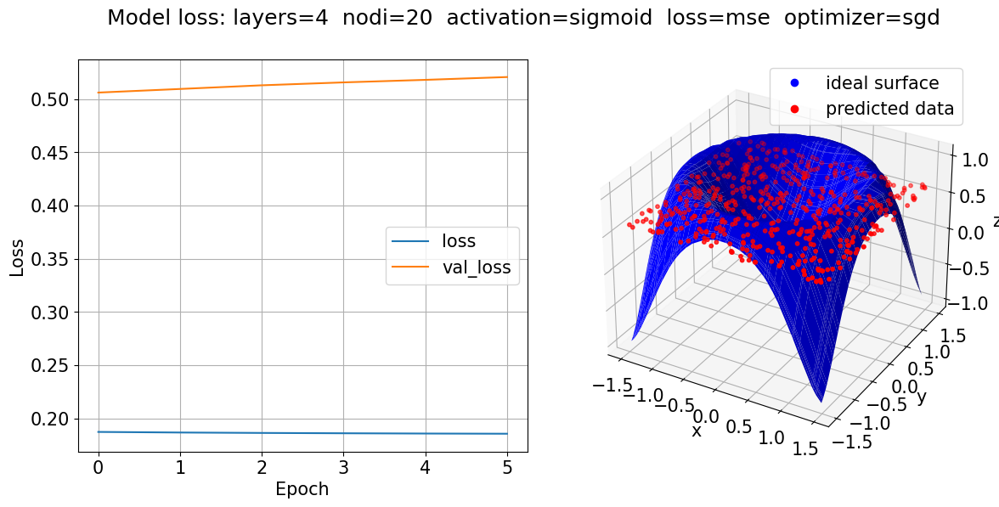

Epoch 1/50
16/16 [==============================] - 0s 4ms/step - loss: 0.2189 - mse: 0.2189 - val_loss: 0.4773 - val_mse: 0.4773
Epoch 2/50
16/16 [==============================] - 0s 1ms/step - loss: 0.1850 - mse: 0.1850 - val_loss: 0.3968 - val_mse: 0.3968
Epoch 3/50
16/16 [==============================] - 0s 1ms/step - loss: 0.1771 - mse: 0.1771 - val_loss: 0.3495 - val_mse: 0.3495
Epoch 4/50
16/16 [==============================] - 0s 1ms/step - loss: 0.1637 - mse: 0.1637 - val_loss: 0.3955 - val_mse: 0.3955
Epoch 5/50
16/16 [==============================] - 0s 1ms/step - loss: 0.1593 - mse: 0.1593 - val_loss: 0.3852 - val_mse: 0.3852
Epoch 6/50
16/16 [==============================] - 0s 1ms/step - loss: 0.1530 - mse: 0.1530 - val_loss: 0.3377 - val_mse: 0.3377
Epoch 7/50
16/16 [==============================] - 0s 1ms/step - loss: 0.1485 - mse: 0.1485 - val_loss: 0.3103 - val_mse: 0.3103
Epoch 8/50
16/16 [==============================] - 0s 1ms/step - loss: 0.1407 - mse: 0.14

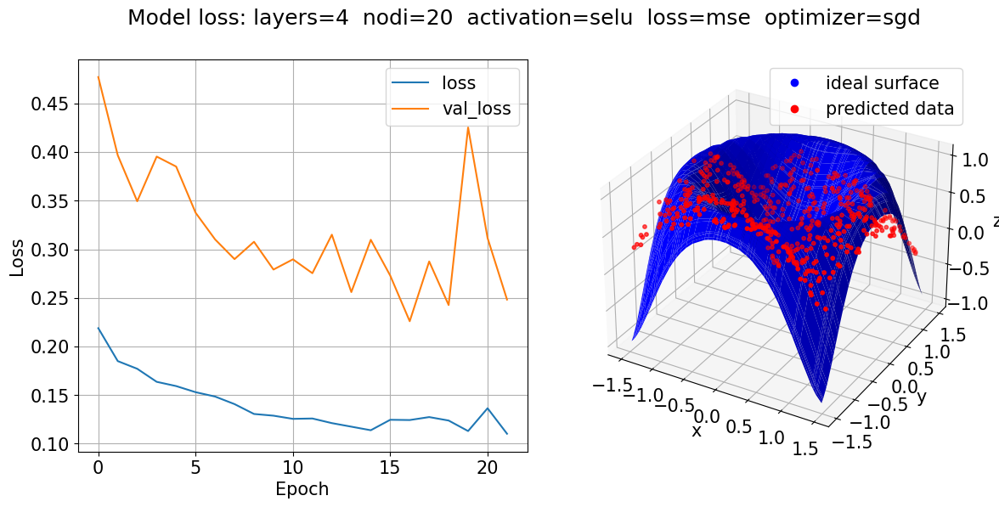

Epoch 1/50
16/16 [==============================] - 0s 4ms/step - loss: 0.3156 - mse: 0.3156 - val_loss: 0.9347 - val_mse: 0.9347
Epoch 2/50
16/16 [==============================] - 0s 1ms/step - loss: 0.3156 - mse: 0.3156 - val_loss: 0.9347 - val_mse: 0.9347
Epoch 3/50
16/16 [==============================] - 0s 1ms/step - loss: 0.3156 - mse: 0.3156 - val_loss: 0.9347 - val_mse: 0.9347
Epoch 4/50
16/16 [==============================] - 0s 1ms/step - loss: 0.3156 - mse: 0.3156 - val_loss: 0.9347 - val_mse: 0.9347
Epoch 5/50
16/16 [==============================] - 0s 1ms/step - loss: 0.3156 - mse: 0.3156 - val_loss: 0.9347 - val_mse: 0.9347
Epoch 6/50
16/16 [==============================] - 0s 375us/step


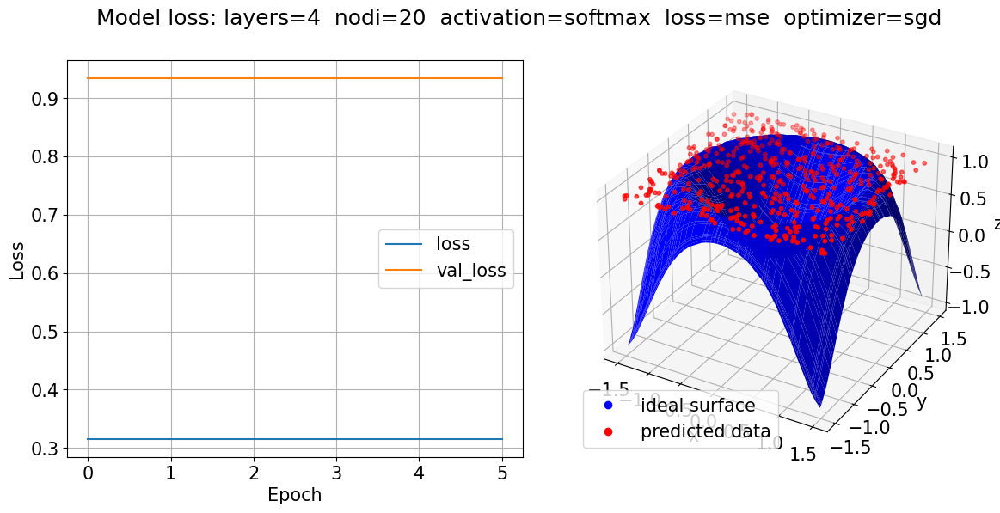

Epoch 1/50
16/16 [==============================] - 0s 5ms/step - loss: 0.5393 - mse: 0.5393 - val_loss: 0.4255 - val_mse: 0.4255
Epoch 2/50
16/16 [==============================] - 0s 1ms/step - loss: 0.4097 - mse: 0.4097 - val_loss: 0.4001 - val_mse: 0.4001
Epoch 3/50
16/16 [==============================] - 0s 1ms/step - loss: 0.2980 - mse: 0.2980 - val_loss: 0.4123 - val_mse: 0.4123
Epoch 4/50
16/16 [==============================] - 0s 1ms/step - loss: 0.2305 - mse: 0.2305 - val_loss: 0.4482 - val_mse: 0.4482
Epoch 5/50
16/16 [==============================] - 0s 1ms/step - loss: 0.2009 - mse: 0.2009 - val_loss: 0.4840 - val_mse: 0.4840
Epoch 6/50
16/16 [==============================] - 0s 1ms/step - loss: 0.1907 - mse: 0.1907 - val_loss: 0.5093 - val_mse: 0.5093
Epoch 7/50
16/16 [==============================] - 0s 386us/step


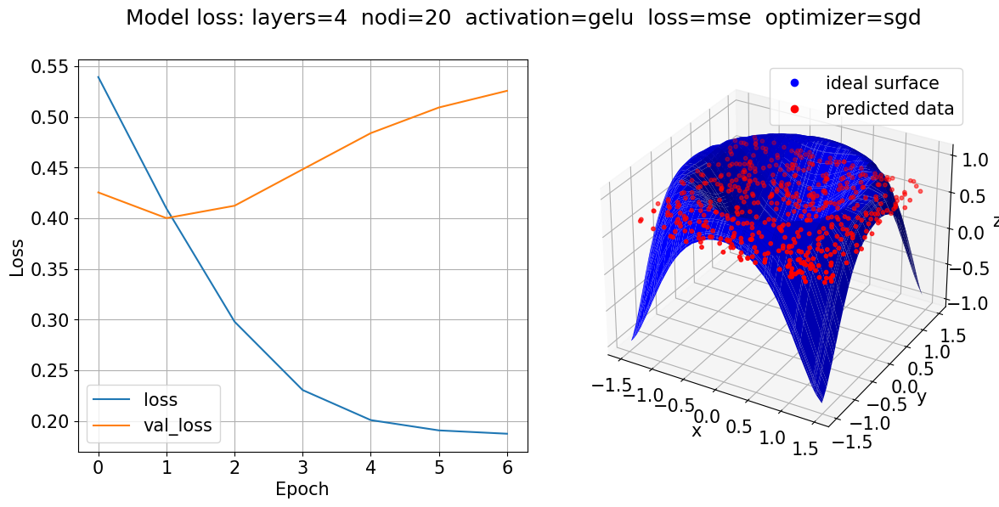

In [219]:
activations = ["relu","tanh","sigmoid","selu","softmax","gelu"]
for act in activations:
    NN_model(act,"mse","sgd",4,20)

- It's difficult to understand if the predicted data fit well, we can evaluate the NN performance from de loss and val loss trend